## Codes for JIA synovium study 
### Preprocessing and broad cell type annotation for scASAP-seq data

*Jun Inamo*

*jun.inamo@cuanschutz.edu*

*Computational Omics and Systems Immunology (COSI) Lab, Division of Rheumatology and Center for Health AI, University of Colorado School of Medicine, CO, USA*


In [1]:
format(Sys.Date(), "%Y-%m-%d")

[1] "2025-07-08"

In [2]:
options(warn = -1)  
options("verbose" = FALSE)
options("show.error.messages" = TRUE)  

In [3]:
suppressMessages({
    setwd("/Users/inamojun/Library/CloudStorage/OneDrive-TheUniversityofColoradoDenver/single_cell_FanLab/projects/JIA_Xenium/R_codes")
    source("utils.R")
    library(gridExtra)
})

Load Seurat object of QCed data

In [4]:
ste = readRDS(paste0("./output/Xenium_merged_final.rds"))
DefaultAssay(ste) = "SCT"

Assign annotated cluster names

In [5]:

celltype="ALL"
resolution <- switch(celltype,
                     "ALL" = "0.20",
                     "T" = "1.00",
                     "M" = "0.20",
                     "B" = "0.40",
                     "Tissue" = "0.60"
)

cluster_col = "res_subtype" 
Idents(ste) = factor(ste@meta.data[,cluster_col])
head(Idents(ste))
DefaultAssay(ste) = "SCT"

cluster_df = read.csv("cluster_annotation.csv")

table(ste@meta.data$res_subtype,ste@meta.data$res_subtype_anno)
table(ste@meta.data$celltype,ste@meta.data$res_subtype_anno)
table(ste@meta.data$ct,ste@meta.data$res_subtype_anno)
table(ste@meta.data$ct_subtype,ste@meta.data$res_subtype_anno)

cluster_COLORS <- manual_colors[1:length(unique(Idents(ste)))]
names(cluster_COLORS) = levels(Idents(ste))

cur_levels <- levels(Idents(ste))
df <- data.frame(level = cur_levels, stringsAsFactors = FALSE)
df$prefix <- sub("^([^-]+)-.*", "\\1", df$level)
df$num <- as.integer(sub("^[^-]+-(\\d+):.*", "\\1", df$level))
prefix_order <- c("T", "B", "M", "Tissue")
df$prefix_factor <- factor(df$prefix, levels = prefix_order)
df_sorted <- df[order(df$prefix_factor, df$num), ]
new_levels <- df_sorted$level
Idents(ste) <- factor(Idents(ste), levels = new_levels)

T_grad <- colorRampPalette(c("#ACD9AE99", "#358A3999"))(25)
Tissue_grad <- colorRampPalette(c("#FFEBED99", "#B71B1B99"))(25)
B_grad <- colorRampPalette(c("#C8B9E599", "#311A9299"))(25)
M_grad <- colorRampPalette(c("gold", "goldenrod3"))(25)
cluster_COLORS_ = c(T_grad[1:length(grep("^T-",levels(Idents(ste))))],
                    B_grad[1:length(grep("^B-",levels(Idents(ste))))],
                    M_grad[1:length(grep("^M-",levels(Idents(ste))))],
                    Tissue_grad[1:length(grep("^Tissue-",levels(Idents(ste))))])
names(cluster_COLORS_) = levels(Idents(ste))
cluster_COLORS_[grepl("venule",names(cluster_COLORS_))] = "grey40"
cluster_COLORS_[grepl("arteriolar",names(cluster_COLORS_))] = "grey70"
cluster_COLORS_[grepl("lymphatic",names(cluster_COLORS_))] = "grey90"
cluster_COLORS_[grepl("mixed",names(cluster_COLORS_))] = "white"

clus = ste@meta.data[,cluster_col] %>% 
  unique() %>%
  stringr::str_split(.,pattern = ":", simplify = TRUE) %>%
  .[,2]
cluster_COLORS__ = manual_colors
names(cluster_COLORS__) = clus
cluster_COLORS__ = na.omit(cluster_COLORS__)

cluster_colors_df <- data.frame(
  cluster =  ste@meta.data[,cluster_col] %>% 
    unique(),
  color = cluster_COLORS__[!is.na(names(cluster_COLORS__))],
  stringsAsFactors = FALSE
)

cluster_colors_df$clean_name <- sub("^[^:]+:", "", cluster_colors_df$cluster)

cluster_colors_mod_df <- data.frame(
  cluster = names(cluster_COLORS_),
  color = cluster_COLORS_,
  stringsAsFactors = FALSE
)

cluster_colors_mod_df$clean_name <- sub("^[^:]+:", "", cluster_colors_mod_df$cluster)

replace_indices <- cluster_colors_df$clean_name %in% cluster_colors_df$clean_name

cluster_colors_df$color[replace_indices] <- cluster_colors_mod_df$color[match(cluster_colors_df$clean_name[replace_indices], cluster_colors_mod_df$clean_name)]

cluster_COLORS__ <- setNames(cluster_colors_df$color, cluster_colors_df$clean_name)


ste@meta.data$new_cluster = factor(stringr::str_split(ste@meta.data$res_subtype,pattern=":",simplify=TRUE)[,2], 
                                   levels = unique(stringr::str_split(levels(Idents(ste)),pattern=":",simplify=TRUE)[,2])) 
Idents(ste) = ste@meta.data$new_cluster
levels(Idents(ste))

ord = levels(Idents(ste))
ord = c(ord[!grepl("venule|arteriolar|lymphatic|mixed",ord)],
        ord[grepl("venule|arteriolar|lymphatic|mixed",ord)])
Idents(ste) = factor(Idents(ste), levels = ord)
ord = levels(Idents(ste))
ord = c(ord[!grepl("mixed",ord)],
        ord[grepl("mixed",ord)])
Idents(ste) = factor(Idents(ste), levels = ord)
levels(Idents(ste))

cluster_COLORS__ = cluster_COLORS__[levels(Idents(ste))]
cluster_COLORS__tmp = cluster_COLORS__
names(cluster_COLORS__tmp) = c("CD4 naïve","CD4 memory","Treg","TPH_TFH","Th1-like Tph",
                               "CD8 naïve","GZMK+ CD8","GZMB+ CD8","IFN stimulated CD8 memory","TRM","Innate-like T",
                               "gdT",
                               "ILCs",
                               "NK cells",
                               "B","plasmablast","plasma",
                               "MERTK+ macrophage","TREM2+ macrophage","pro-inflammatory  macrophage","stressed macrophage",
                               "DC1","DC2","pDC","mregDC","mast cell",
                               "proliferating cells",
                               "PRG4+ lining fibroblast","PRG4+DKK3+ lining fibroblast",
                               "CXCL12+DKK3+ intermediate fibroblast","RSPO3+ intermediate fibroblast",
                               "POSTN+ sublining fibroblast","NOTCH3+ sublining fibroblast","CD34+PI16+DPP4+ sublining","CXCL12+ sublining fibroblast",
                               "muscle",
                               "venule","NOTCH4+ arteriolar","lymphatic",
                               "mixed")
cluster_COLORS__ = cluster_COLORS__tmp
cluster_COLORS__[names(cluster_COLORS__)=="NK cells"]="turquoise"
cluster_COLORS__[names(cluster_COLORS__)=="ILCs"]="darkblue"
Idents(ste) = factor(Idents(ste), levels = names(cluster_COLORS__))

cluster_col = "new_cluster"

SB4_aaafimfi-1                        SB4_aabehemd-1 
                     Tissue-18:muscle Tissue-1:CXCL12+ sublining fibroblast 
                       SB4_aabgdeom-1                        SB4_aabgdpha-1 
                M-1:MERTK+ macrophage      Tissue-0:PRG4+ lining fibroblast 
                       SB4_aabiiohn-1                        SB4_aabjjbnp-1 
                      Tissue-3:venule                       Tissue-8:venule 
77 Levels: B-0:plasma B-10:plasma B-11:plasma B-12:plasma ... Tissue-9:NOTCH4+ arteriolar

                                                
                                                     B
  B-0:plasma                                         0
  B-10:plasma                                        0
  B-11:plasma                                        0
  B-12:plasma                                        0
  B-13:plasma                                        0
  B-14:plasma                                        0
  B-1:B                                          10167
  B-2:mixed                                          0
  B-3:plasma                                         0
  B-4:B                                           1777
  B-5:plasma                                         0
  B-6:plasma                                         0
  B-7:B                                            815
  B-8:B                                            803
  B-9:plasmablast                                    0
  M-0:TREM2+ macrophage                              0
  M-10:DC1      

        
             B CD34+PI16+DPP4+ sublining CD4 memory        CD4 na<U+00EF>ve
  B      13562                         0          0                0
  M          0                         0          0                0
  T          0                         0       5828              624
  Tissue     0                      3527          0                0
        
                CD8 na<U+00EF>ve CXCL12+ sublining fibroblast
  B                     0                            0
  M                     0                            0
  T                  3425                            0
  Tissue                0                        42033
        
         CXCL12+DKK3+ intermediate fibroblast   DC1   DC2 GZMB+ CD8 GZMK+ CD8
  B                                         0     0     0         0         0
  M                                         0  1095  2276         0         0
  T                                         0     0     0       477      9680
  Tissue                   

                                        
                                             B CD34+PI16+DPP4+ sublining
  B-0: CD24+CD27+CD11b+ switched memory   4747                         0
  B-2: IgM+IgD+TCL1A+ naive               4937                         0
  B-8: IgG1+IgG3+ plasma                  2328                         0
  B-1: CD24++CD27+IgM+ unswitched memory   830                         0
  B-3: IgM+IgD+CD1c+ MZ-like               223                         0
  B-5: CD11c+LAMP1+ ABC                    330                         0
  B-6: IgM+ plasma                          24                         0
  B-7: HLA-DR+IgG+ plasmablast             100                         0
  B-4: AICDA+BCL6+ GC-like                  43                         0
  E-1: LIFR+ venular                         0                         7
  E-0: SPARC+ capillary                      0                         5
  E-2: ICAM1+ venular                        0                         0
  E-3: NOT

                                        
                                             B CD34+PI16+DPP4+ sublining
  B-0: CD24+CD27+CD11b+ switched memory   4747                         0
  B-2: IgM+IgD+TCL1A+ naive               4937                         0
  B-8: IgG1+IgG3+ plasma                  2328                         0
  B-1: CD24++CD27+IgM+ unswitched memory   830                         0
  B-3: IgM+IgD+CD1c+ MZ-like               223                         0
  B-5: CD11c+LAMP1+ ABC                    330                         0
  B-6: IgM+ plasma                          24                         0
  B-7: HLA-DR+IgG+ plasmablast             100                         0
  B-4: AICDA+BCL6+ GC-like                  43                         0
  E-1: LIFR+ venular                         0                         7
  E-0: SPARC+ capillary                      0                         5
  E-2: ICAM1+ venular                        0                         0
  E-3: NOT

[1] "mixed"                               
 [2] "CD4 memory"                          
 [3] "GZMK+ CD8"                           
 [4] "CD8 na<U+00EF>ve"                    
 [5] "gdT"                                 
 [6] "Treg"                                
 [7] "TPH_TFH"                             
 [8] "ILCs"                                
 [9] "TRM"                                 
[10] "NK cells"                            
[11] "Innate-like T"                       
[12] "IFN stimulated CD8 memory"           
[13] "Th1-like Tph"                        
[14] "CD4 na<U+00EF>ve"                    
[15] "GZMB+ CD8"                           
[16] "plasma"                              
[17] "B"                                   
[18] "plasmablast"                         
[19] "TREM2+ macrophage"                   
[20] "MERTK+ macrophage"                   
[21] "pro-inflammatory  macrophage"        
[22] "proliferating cells"                 
[23] "mregDC"                              
[24] "DC2"                                 
[25] "pDC"                                 
[26] "mast cell"                           
[27] "DC1"                                 
[28] "stressed macrophage"                 
[29] "PRG4+ lining fibroblast"             
[30] "CXCL12+ sublining fibroblast"        
[31] "NOTCH3+ sublining fibroblast"        
[32] "venule"                              
[33] "CXCL12+DKK3+ intermediate fibroblast"
[34] "POSTN+ sublining fibroblast"         
[35] "NOTCH4+ arteriolar"                  
[36] "PRG4+DKK3+ lining fibroblast"        
[37] "lymphatic"                           
[38] "CD34+PI16+DPP4+ sublining"           
[39] "muscle"                              
[40] "RSPO3+ intermediate fibroblast"

[1] "CD4 memory"                          
 [2] "GZMK+ CD8"                           
 [3] "CD8 na<U+00EF>ve"                    
 [4] "gdT"                                 
 [5] "Treg"                                
 [6] "TPH_TFH"                             
 [7] "ILCs"                                
 [8] "TRM"                                 
 [9] "NK cells"                            
[10] "Innate-like T"                       
[11] "IFN stimulated CD8 memory"           
[12] "Th1-like Tph"                        
[13] "CD4 na<U+00EF>ve"                    
[14] "GZMB+ CD8"                           
[15] "plasma"                              
[16] "B"                                   
[17] "plasmablast"                         
[18] "TREM2+ macrophage"                   
[19] "MERTK+ macrophage"                   
[20] "pro-inflammatory  macrophage"        
[21] "proliferating cells"                 
[22] "mregDC"                              
[23] "DC2"                                 
[24] "pDC"                                 
[25] "mast cell"                           
[26] "DC1"                                 
[27] "stressed macrophage"                 
[28] "PRG4+ lining fibroblast"             
[29] "CXCL12+ sublining fibroblast"        
[30] "NOTCH3+ sublining fibroblast"        
[31] "CXCL12+DKK3+ intermediate fibroblast"
[32] "POSTN+ sublining fibroblast"         
[33] "PRG4+DKK3+ lining fibroblast"        
[34] "CD34+PI16+DPP4+ sublining"           
[35] "muscle"                              
[36] "RSPO3+ intermediate fibroblast"      
[37] "venule"                              
[38] "NOTCH4+ arteriolar"                  
[39] "lymphatic"                           
[40] "mixed"

In [6]:
table(Idents(ste))
sum(table(Idents(ste)))


                          CD4 memory                                 Treg 
                                5828                                 2150 
                             TPH_TFH                         Th1-like Tph 
                                1828                                  793 
                           GZMK+ CD8                            GZMB+ CD8 
                                9680                                  477 
           IFN stimulated CD8 memory                                  TRM 
                                 794                                 1463 
                       Innate-like T                                  gdT 
                                 895                                 2210 
                                ILCs                             NK cells 
                                1561                                 1312 
                                   B                          plasmablast 
                        

[1] 426070

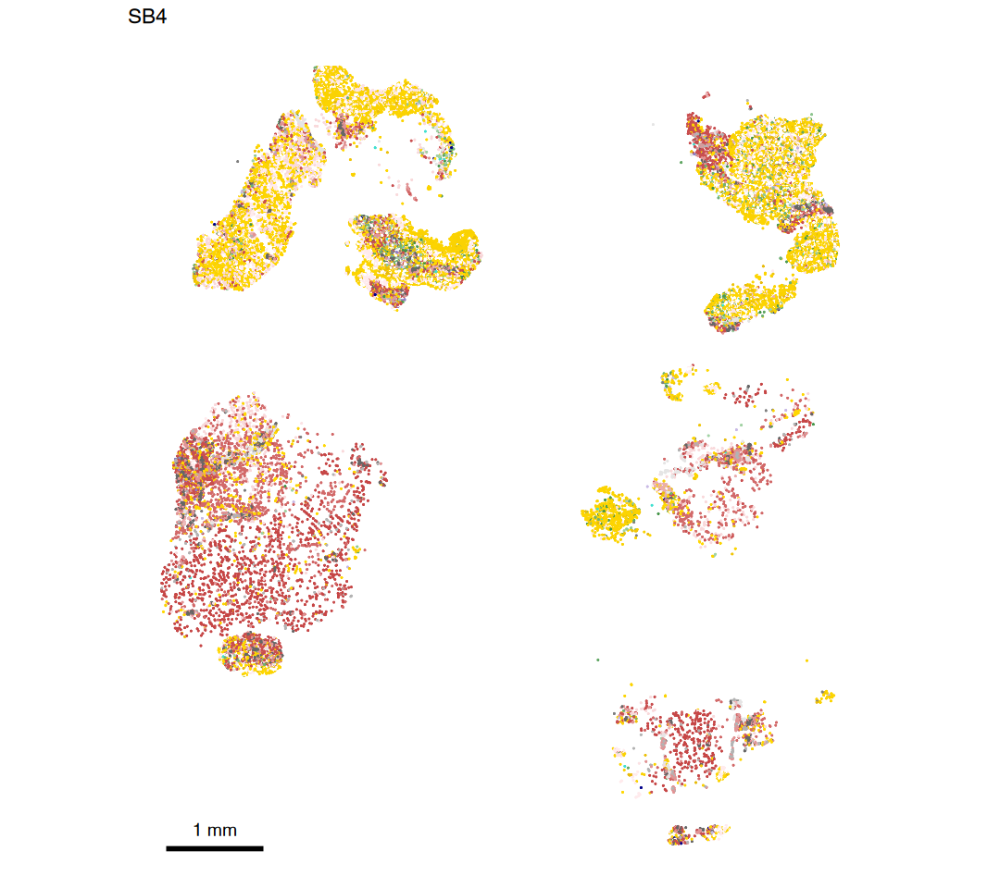

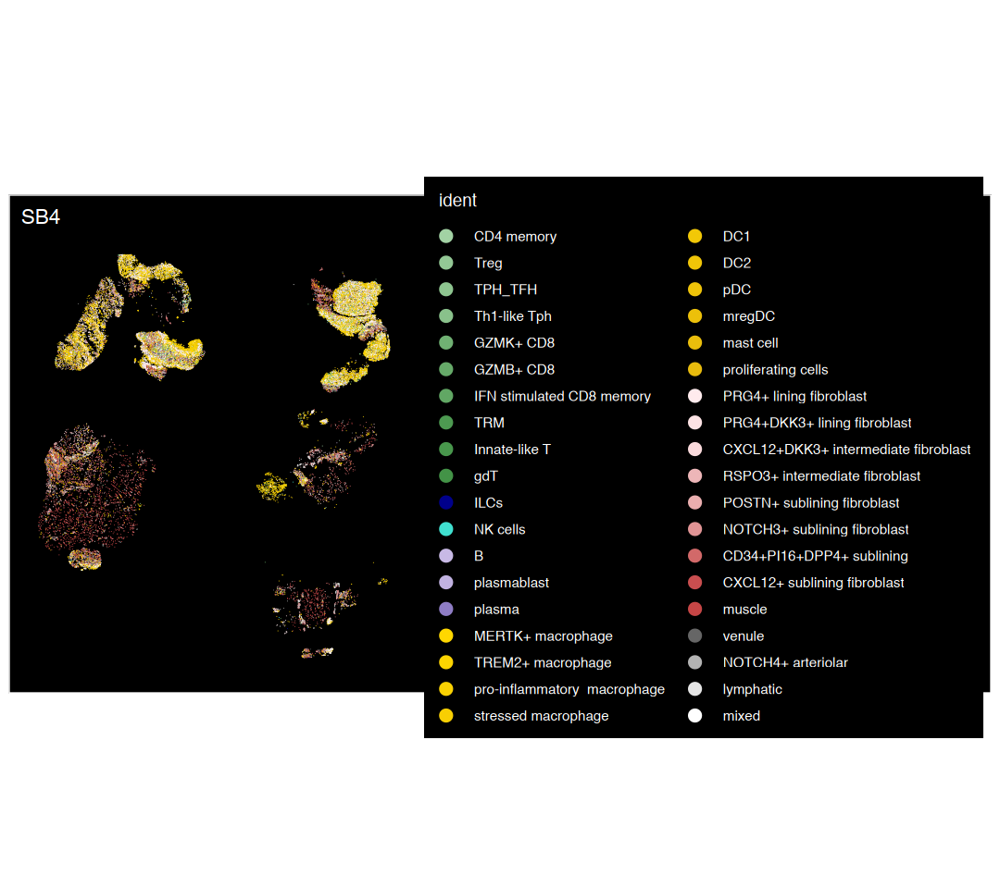

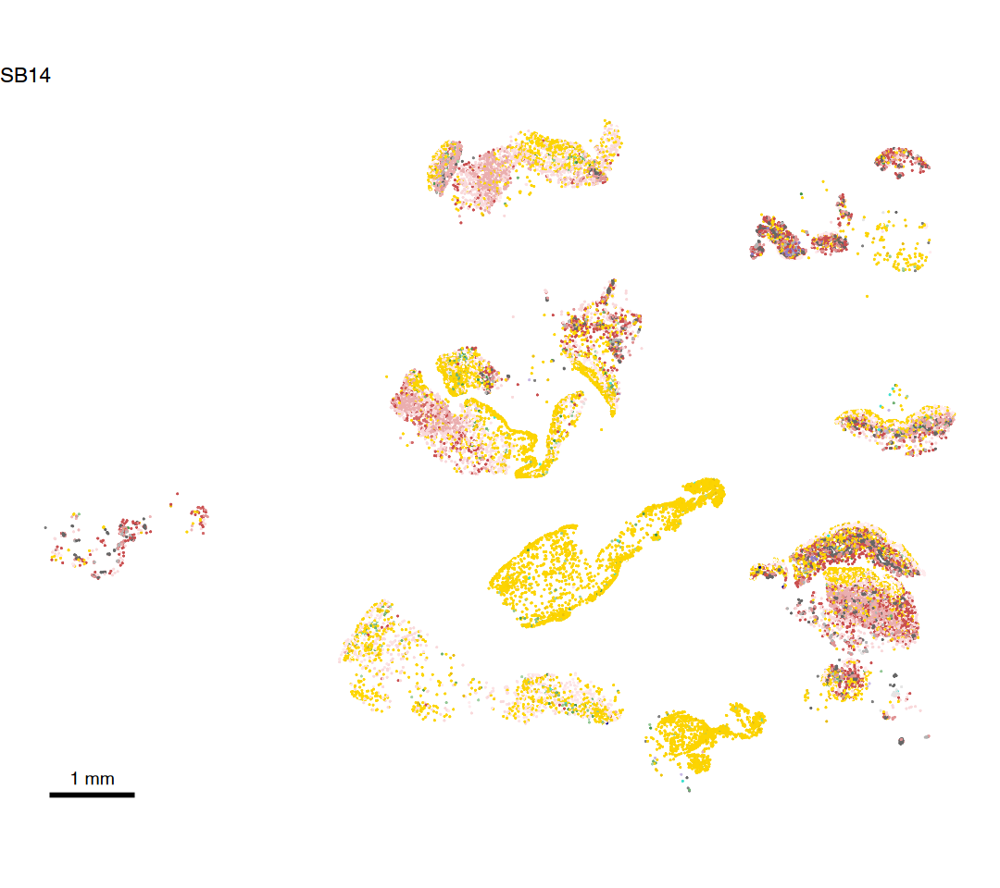

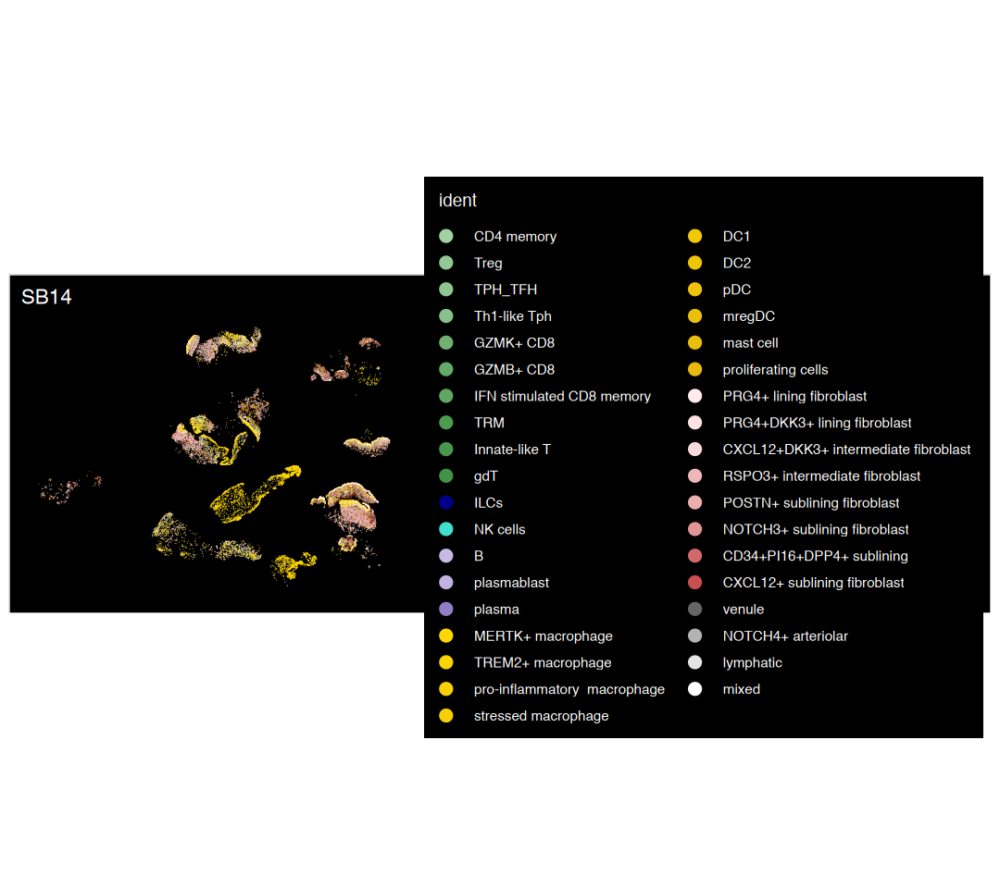

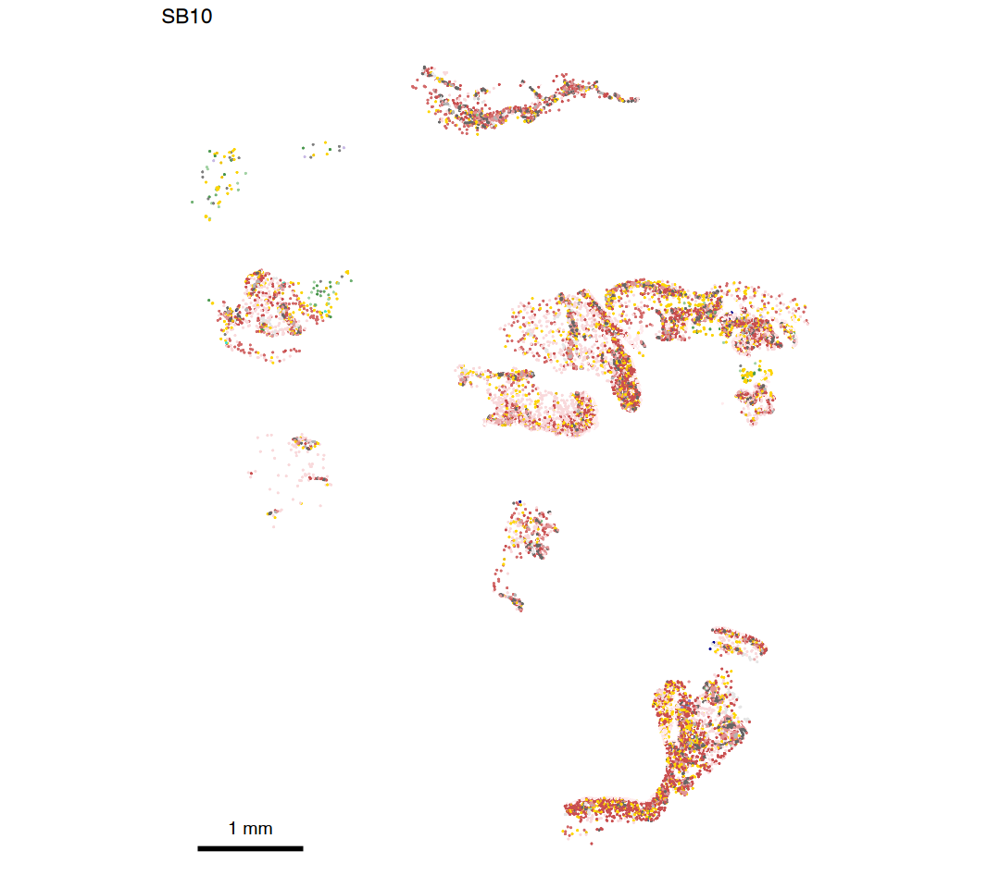

...

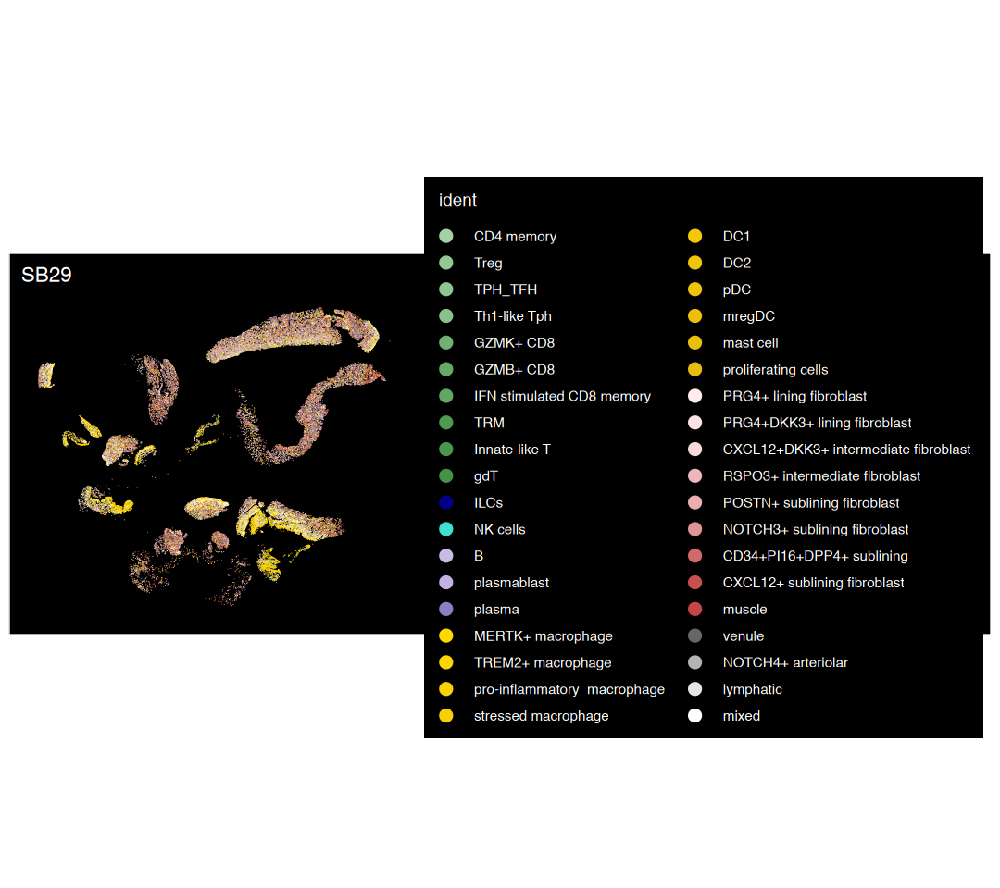

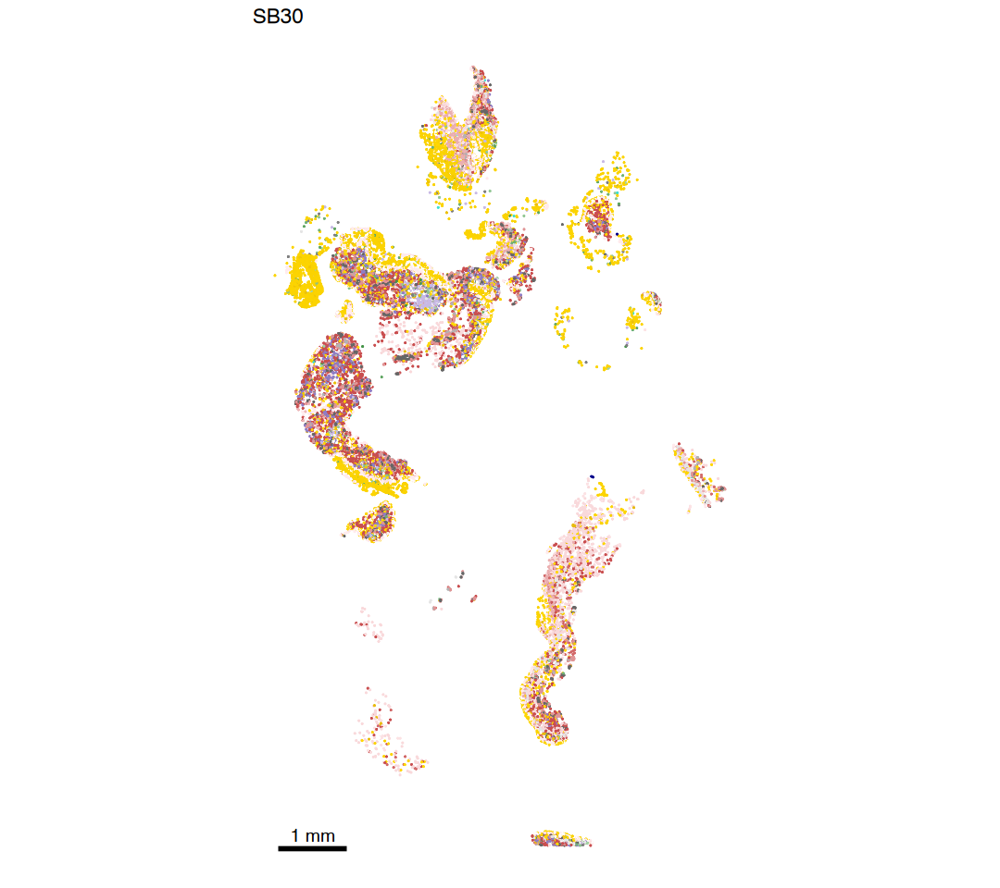

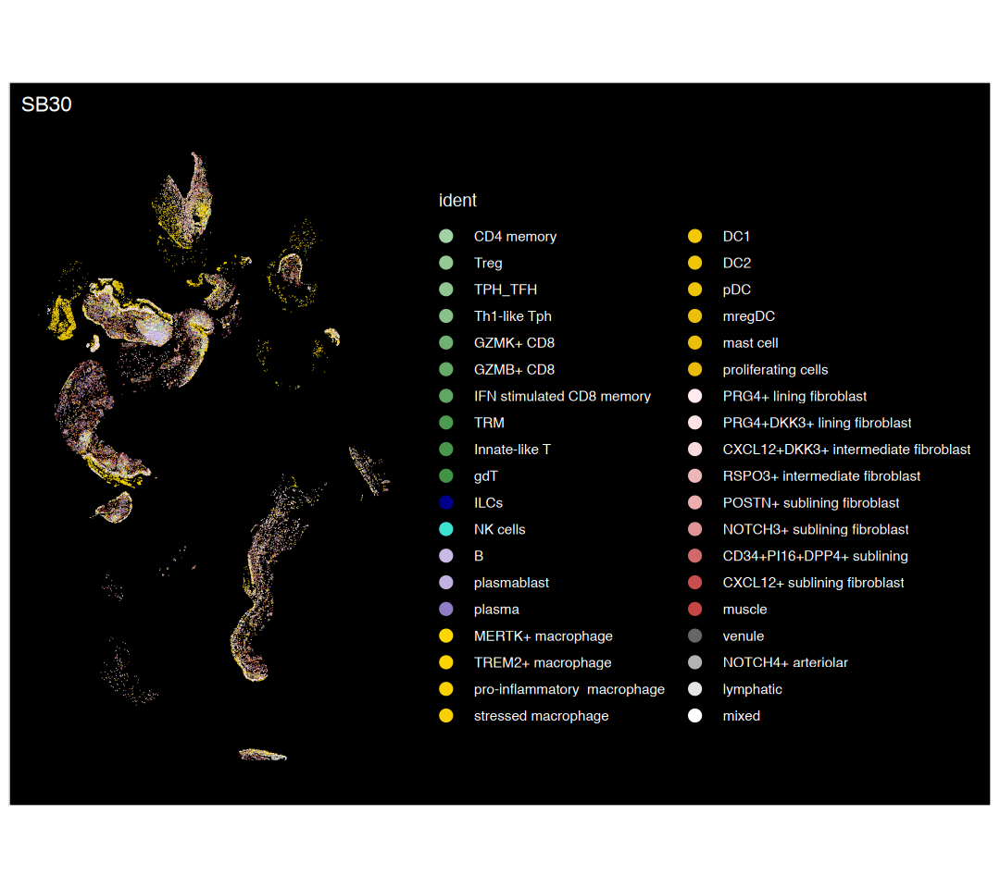

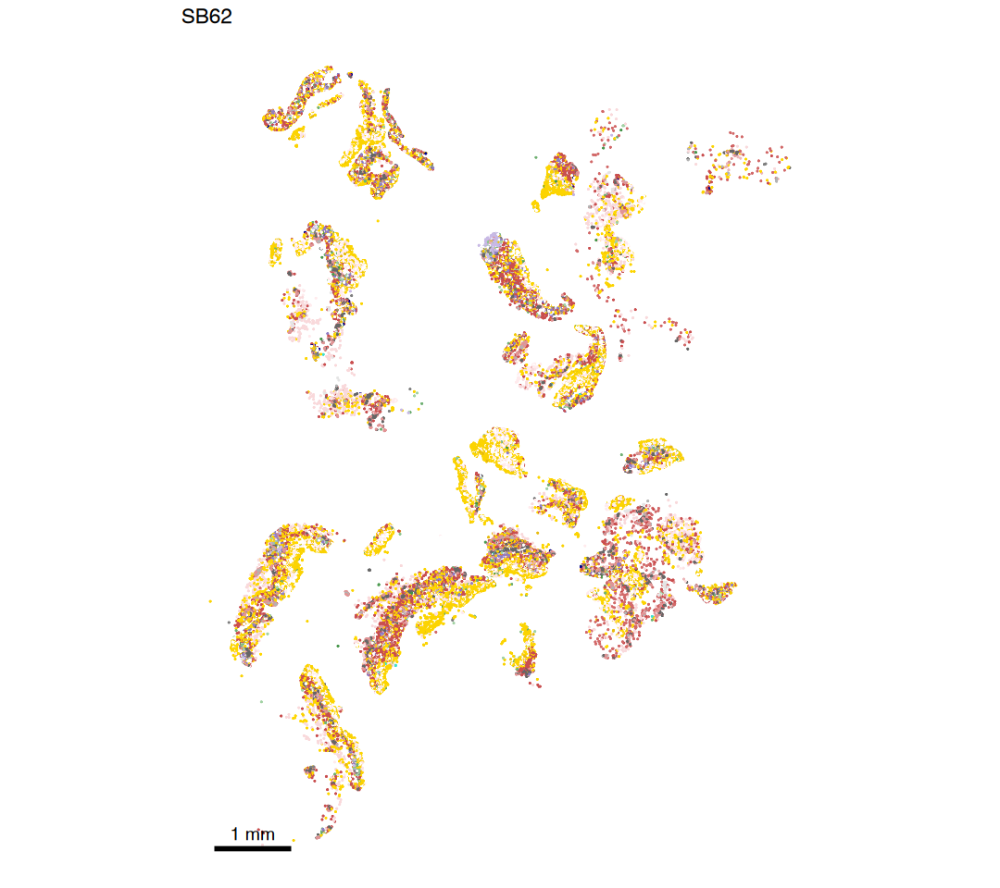

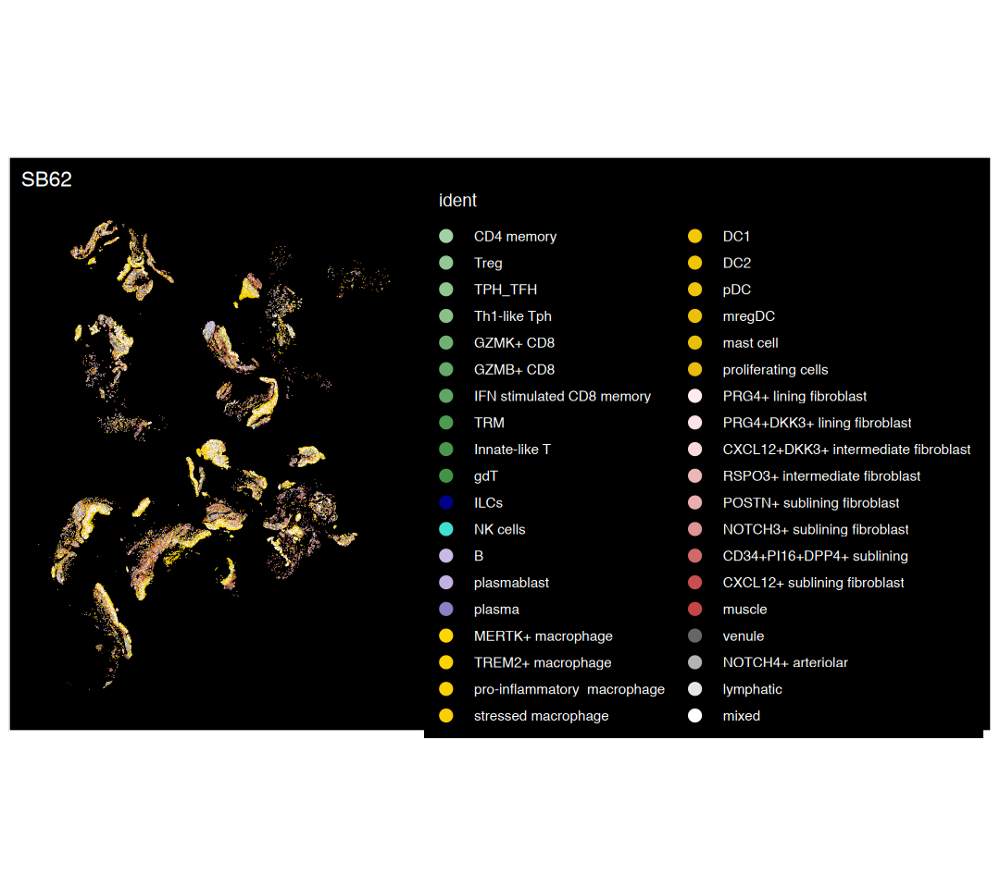

In [7]:
options(repr.plot.width = 9, repr.plot.height = 8)

for (name in c("SB4","SB14","SB10","SB19","SB25","SB21","SB29","SB30","SB62")) {
  
  coords = ste[[name]]$centroids@coords %>%
    as.data.frame() %>%
    dplyr::mutate(cell = Cells(ste[[name]])) %>%
    dplyr::left_join(.,ste@meta.data %>%
                       .[,c("cell",cluster_col)],by="cell")

    g = ggplot(coords, aes(x = y, y = x, color = .data[[cluster_col]]) ) +
    geom_point_rast(size = 0.01) +
    scale_color_manual(values = cluster_COLORS__) +
    coord_fixed() +
    annotate("segment", x = min(coords$y) + 50, xend = min(coords$y) + 1050, 
             y = min(coords$x) - 50, yend = min(coords$x) - 50, 
             color = "black", size = 1.2) +
    annotate("text", x = min(coords$y) + 550, y = min(coords$x) + 150, 
             label = "1 mm", size = 4) +
    theme_void() +
    theme(legend.position = "none") +
    ggtitle(paste0(name))
  plot(g)

  g = ImageDimPlot(ste, 
                   size = 0.01, 
                   fov = name,
                   border.color = "grey90",
                   border.size = 0.001) &
    scale_fill_manual(values = cluster_COLORS__) &
    theme(legend.position = "right") &
    annotate("segment", x = min(coords$y) + 50, xend = min(coords$y) + 1050, 
             y = min(coords$x) - 50, yend = min(coords$x) - 50, 
             color = "black", size = 1.2) &
    annotate("text", x = min(coords$y) + 550, y = min(coords$x) + 250, 
             label = "1 mm", size = 4) &
    ggtitle(name)
  plot(g)
}



In [8]:
# remove clusters that are not needed
ste = subset(ste, new_cluster!="mixed")
ste = subset(ste, new_cluster!="muscle")
sum(table(Idents(ste)))


[1] 376949

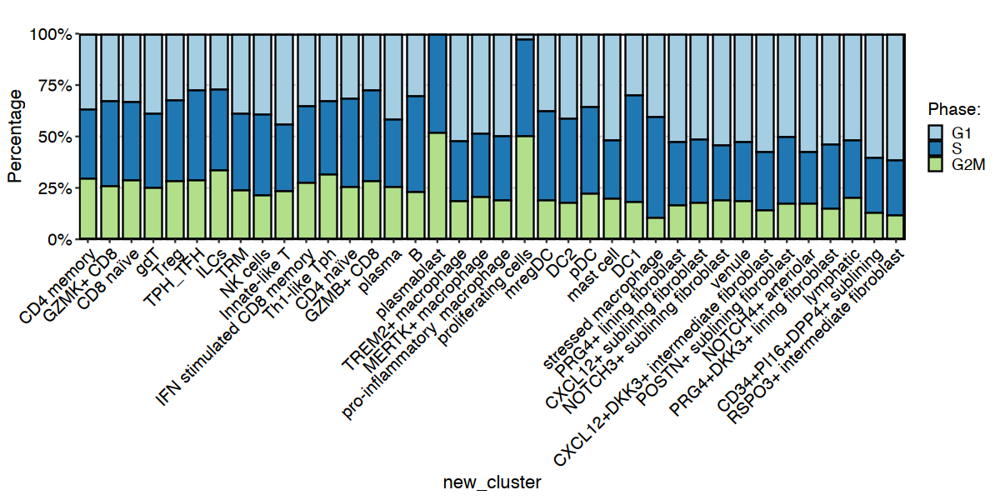

In [9]:
options(repr.plot.width = 10, repr.plot.height = 5)

g = CellStatPlot(ste, stat.by = "Phase", group.by = cluster_col, label = FALSE)
plot(g)

In [10]:
table(ste@meta.data$celltype)
nrow(ste@meta.data[grep("fibroblast",ste@meta.data$new_cluster),])
nrow(ste@meta.data[grep("venule|lymphatic|arteriolar",ste@meta.data$new_cluster),])



     B      M      T Tissue 
 36746 126894  33040 184318 

[1] 138436

[1] 42355

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


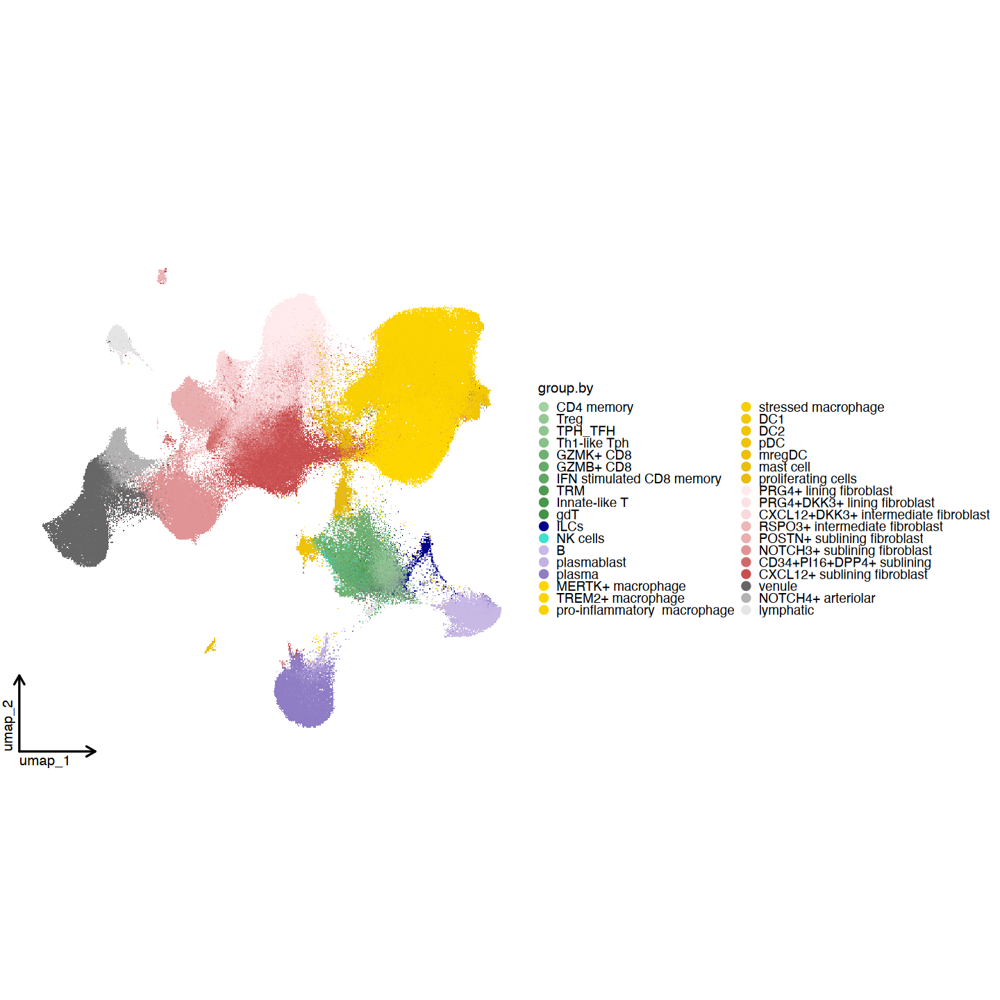

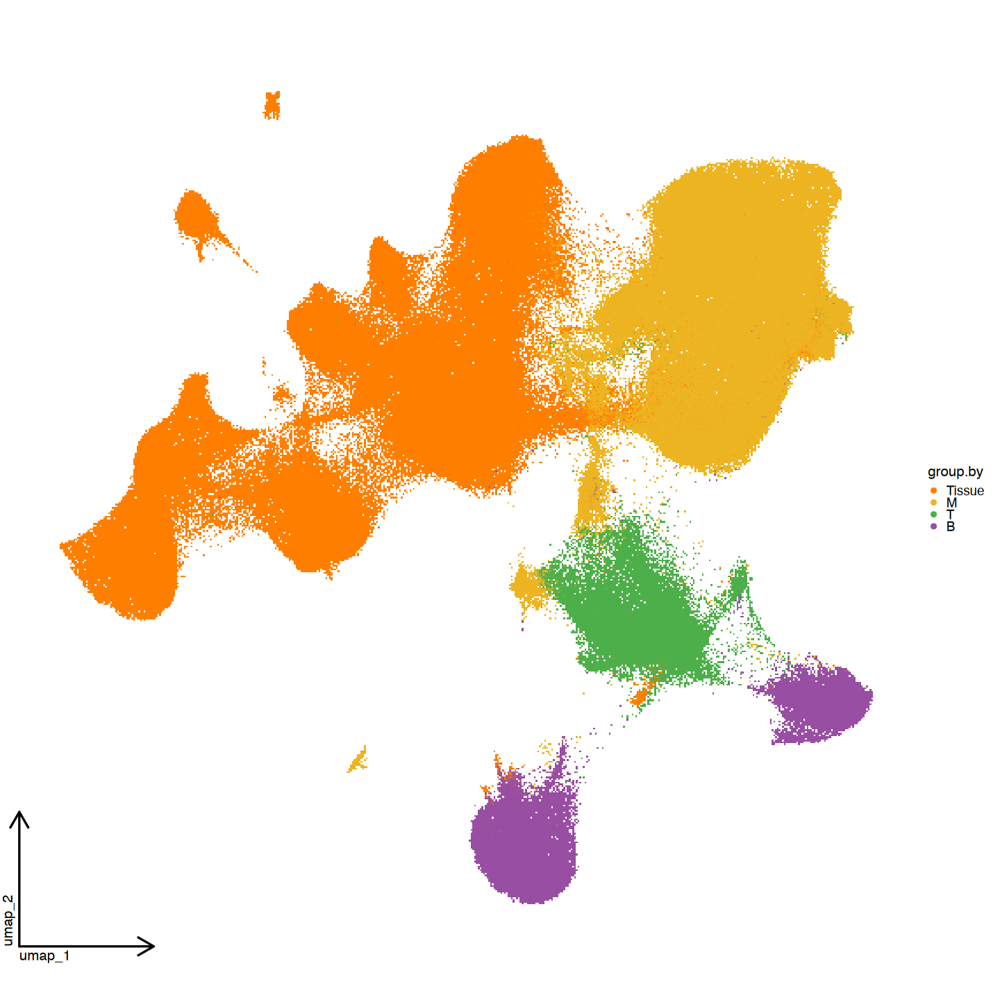

In [11]:
options(repr.plot.width = 12, repr.plot.height = 12)

g = CellDimPlot(
  srt = ste, 
  group.by = cluster_col, 
  reduction = "UMAP", theme_use = "theme_blank",
  raster = TRUE,
  stat_plot_size = 0.1
) &
  scale_color_manual(breaks = names(cluster_COLORS__),
                     values = cluster_COLORS__) &
  guides(color = guide_legend(override.aes = list(size = 3)))
plot(g)

g = CellDimPlot(
  srt = ste, 
  group.by = "celltype", 
  reduction = "UMAP", theme_use = "theme_blank",
  raster = TRUE,
  stat_plot_size = 0.1
) &
  scale_color_manual(values = c("T" = "#4DAF4A",
                                "B" = "#984EA3",
                                "M" = "goldenrod2",
                                "Tissue" = "#FF7F00"))
plot(g)



Cluster,Sample,Value,Percentage
<chr>,<chr>,<int>,<dbl>
GZMB+ CD8,SB10,1,0.008162599
GZMB+ CD8,SB14,18,0.077804193
GZMB+ CD8,SB19,75,0.095041375
GZMB+ CD8,SB21,121,0.185295784
GZMB+ CD8,SB25,67,0.126740315
GZMB+ CD8,SB29,44,0.101017058
GZMB+ CD8,SB30,24,0.081774507
GZMB+ CD8,SB4,63,0.194396445
GZMB+ CD8,SB62,64,0.163386179


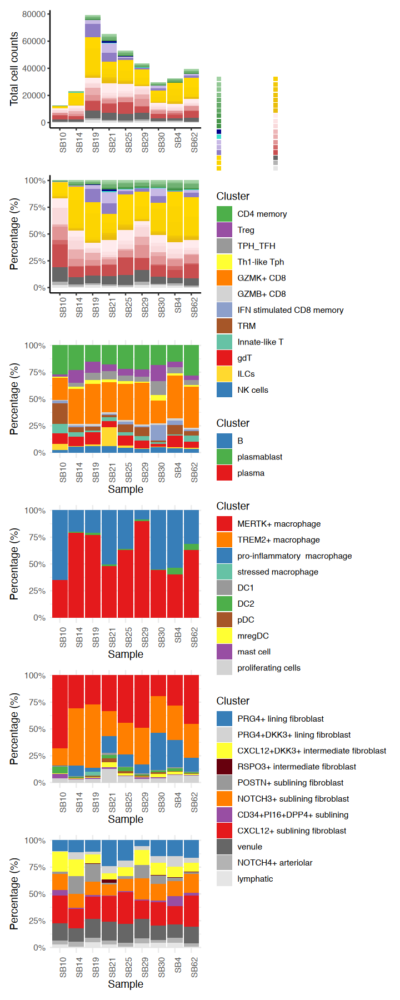

In [12]:
options(repr.plot.width = 6, repr.plot.height = 15)

cluster_stats <- Cluster_Stats_All_Samples(seurat_object = ste, group_by_var = "sample_id")

g_ = cluster_stats[,grep("%$",colnames(cluster_stats),invert = TRUE)] %>%
  dplyr::select(-Number, -Freq) %>%  
  tidyr::pivot_longer(cols = -Cluster, names_to = "Sample", values_to = "Value") %>%
  dplyr::filter(Cluster %in% levels(Idents(ste))) %>%
  dplyr::group_by(Sample) %>%
  dplyr::mutate(Percentage = Value / sum(Value) * 100) %>%
  dplyr::ungroup() %>%
  na.omit() %>%
  dplyr::mutate(Cluster = factor(Cluster, levels = levels(Idents(ste)))) %>%
  ggplot(., aes(x = Sample, y = Value, fill = factor(Cluster))) +
  geom_bar(stat = "identity") +
  labs(x = "", y = "Total cell counts", fill = "Cluster") +
  scale_color_manual(values = cluster_COLORS__) +
  scale_fill_manual(values = cluster_COLORS__) +
  theme_classic() +
  theme(legend.position = "right",
        legend.title = element_text(size = 0),
        legend.text = element_text(size = 4),
        legend.key.size = unit(0.2, "cm"),
        axis.text.x = element_text(angle = 90, hjust = 1))

cluster_stats[,grep("%$",colnames(cluster_stats),invert = TRUE)] %>%
  dplyr::select(-Number, -Freq) %>%  
  tidyr::pivot_longer(cols = -Cluster, names_to = "Sample", values_to = "Value") %>%
  dplyr::filter(Cluster %in% levels(Idents(ste))) %>%
  dplyr::group_by(Sample) %>%
  dplyr::mutate(Percentage = Value / sum(Value) * 100) %>%
  dplyr::ungroup() %>%
  na.omit() %>%
  dplyr::filter(grepl("GZMB",Cluster))
g = cluster_stats[,grep("%$",colnames(cluster_stats),invert = TRUE)] %>%
  dplyr::select(-Number, -Freq) %>%  
  tidyr::pivot_longer(cols = -Cluster, names_to = "Sample", values_to = "Value") %>%
  dplyr::filter(Cluster %in% levels(Idents(ste))) %>%
  dplyr::group_by(Sample) %>%
  dplyr::mutate(Percentage = Value / sum(Value) * 100) %>%
  dplyr::ungroup() %>%
  na.omit() %>%
  dplyr::mutate(Cluster = factor(Cluster, levels = levels(Idents(ste)))) %>%
  ggplot(., aes(x = Sample, y = Percentage, fill = factor(Cluster))) +
  geom_bar(stat = "identity") +
  scale_y_continuous(labels = scales::percent_format(scale = 1)) +
  labs(x = "", y = "Percentage (%)", fill = "Cluster") +
  scale_color_manual(values = cluster_COLORS__) +
  scale_fill_manual(values = cluster_COLORS__) +
  theme_classic() +
  theme(legend.position = "right",
        legend.title = element_text(size = 0),
        legend.text = element_text(size = 4),
        legend.key.size = unit(0.2, "cm"),
        axis.text.x = element_text(angle = 90, hjust = 1))

cluster_stats <- Cluster_Stats_All_Samples(seurat_object = ste, group_by_var = "sample_id")

CELL="T" 
clus = unique(Idents(ste)[ste@meta.data$celltype==CELL])
cluster_COLORS___ = manual_colors[1:length(clus)]
names(cluster_COLORS___) = clus
cluster_COLORS___ = cluster_COLORS___[intersect(levels(Idents(ste)),clus)]
g_t = cluster_stats[,grep("%$",colnames(cluster_stats),invert = TRUE)] %>%
  dplyr::select(-Number, -Freq) %>%  
  dplyr::filter(Cluster!="mixed") %>%
  tidyr::pivot_longer(cols = -Cluster, names_to = "Sample", values_to = "Value") %>%
  dplyr::filter(Cluster %in% clus) %>%
  dplyr::group_by(Sample) %>%
  dplyr::mutate(Percentage = Value / sum(Value) * 100) %>%
  dplyr::ungroup() %>%
  na.omit() %>%
  dplyr::mutate(Cluster = factor(Cluster, levels = levels(Idents(ste)))) %>%
  ggplot(., aes(x = Sample, y = Percentage, fill = factor(Cluster))) +
  geom_bar(stat = "identity") +
  scale_y_continuous(labels = scales::percent_format(scale = 1)) +
  labs(x = "Sample", y = "Percentage (%)", fill = "Cluster") +
  scale_color_manual(breaks = names(cluster_COLORS___), values = cluster_COLORS___) +
  scale_fill_manual(breaks = names(cluster_COLORS___), values = cluster_COLORS___) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1))

CELL="B" 
clus = unique(Idents(ste)[ste@meta.data$celltype==CELL])
cluster_COLORS___ = manual_colors[1:length(clus)]
names(cluster_COLORS___) = clus
cluster_COLORS___ = cluster_COLORS___[intersect(levels(Idents(ste)),clus)]
g_b = cluster_stats[,grep("%$",colnames(cluster_stats),invert = TRUE)] %>%
  dplyr::select(-Number, -Freq) %>%  
  dplyr::filter(Cluster!="mixed") %>%
  tidyr::pivot_longer(cols = -Cluster, names_to = "Sample", values_to = "Value") %>%
  dplyr::filter(Cluster %in% clus) %>%
  dplyr::group_by(Sample) %>%
  dplyr::mutate(Percentage = Value / sum(Value) * 100) %>%
  dplyr::ungroup() %>%
  na.omit() %>%
  dplyr::mutate(Cluster = factor(Cluster, levels = levels(Idents(ste)))) %>%
  ggplot(., aes(x = Sample, y = Percentage, fill = factor(Cluster))) +
  geom_bar(stat = "identity") +
  scale_y_continuous(labels = scales::percent_format(scale = 1)) +
  labs(x = "Sample", y = "Percentage (%)", fill = "Cluster") +
  scale_color_manual(breaks = names(cluster_COLORS___), values = cluster_COLORS___) +
  scale_fill_manual(breaks = names(cluster_COLORS___), values = cluster_COLORS___) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1))

CELL="M" 
clus = unique(Idents(ste)[ste@meta.data$celltype==CELL])
cluster_COLORS___ = manual_colors[1:length(clus)]
names(cluster_COLORS___) = clus
cluster_COLORS___ = cluster_COLORS___[intersect(levels(Idents(ste)),clus)]
g_m = cluster_stats[,grep("%$",colnames(cluster_stats),invert = TRUE)] %>%
  dplyr::select(-Number, -Freq) %>%  
  dplyr::filter(Cluster!="mixed") %>%
  tidyr::pivot_longer(cols = -Cluster, names_to = "Sample", values_to = "Value") %>%
  dplyr::filter(Cluster %in% clus) %>%
  dplyr::group_by(Sample) %>%
  dplyr::mutate(Percentage = Value / sum(Value) * 100) %>%
  dplyr::ungroup() %>%
  na.omit() %>%
  dplyr::mutate(Cluster = factor(Cluster, levels = levels(Idents(ste)))) %>%
  ggplot(., aes(x = Sample, y = Percentage, fill = factor(Cluster))) +
  geom_bar(stat = "identity") +
  scale_y_continuous(labels = scales::percent_format(scale = 1)) +
  labs(x = "Sample", y = "Percentage (%)", fill = "Cluster") +
  scale_color_manual(breaks = names(cluster_COLORS___), values = cluster_COLORS___) +
  scale_fill_manual(breaks = names(cluster_COLORS___), values = cluster_COLORS___) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1))

CELL="Tissue" 
clus = unique(Idents(ste)[ste@meta.data$celltype==CELL])
cluster_COLORS___ = manual_colors[1:length(clus)]
names(cluster_COLORS___) = clus
cluster_COLORS___ = cluster_COLORS___[intersect(levels(Idents(ste)),clus)]
cluster_COLORS___[grepl("venule",names(cluster_COLORS___))] = "grey40"
cluster_COLORS___[grepl("arteriolar",names(cluster_COLORS___))] = "grey70"
cluster_COLORS___[grepl("lymphatic",names(cluster_COLORS___))] = "grey90"
g_tissue = cluster_stats[,grep("%$",colnames(cluster_stats),invert = TRUE)] %>%
  dplyr::select(-Number, -Freq) %>%  
  dplyr::filter(Cluster!="mixed") %>%
  tidyr::pivot_longer(cols = -Cluster, names_to = "Sample", values_to = "Value") %>%
  dplyr::filter(Cluster %in% clus) %>%
  dplyr::group_by(Sample) %>%
  dplyr::mutate(Percentage = Value / sum(Value) * 100) %>%
  dplyr::ungroup() %>%
  na.omit() %>%
  dplyr::mutate(Cluster = factor(Cluster, levels = levels(Idents(ste)))) %>%
  ggplot(., aes(x = Sample, y = Percentage, fill = factor(Cluster))) +
  geom_bar(stat = "identity") +
  scale_y_continuous(labels = scales::percent_format(scale = 1)) +
  labs(x = "Sample", y = "Percentage (%)", fill = "Cluster") +
  scale_color_manual(breaks = names(cluster_COLORS___), values = cluster_COLORS___) +
  scale_fill_manual(breaks = names(cluster_COLORS___), values = cluster_COLORS___) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1))

(g_ / g / g_t / g_b / g_m / g_tissue) + plot_layout(guides = "collect")




### Covarying neighborhood analysis

In [13]:
colnames(ste@meta.data)
ste@meta.data[1:5,1:40]
unique(ste@meta.data$treatment)
unique(ste@meta.data$JIA_type)

[1] "orig.ident"                                                                                     
  [2] "nCount_Spatial"                                                                                 
  [3] "nFeature_Spatial"                                                                               
  [4] "nCount_BlankCodeword"                                                                           
  [5] "nFeature_BlankCodeword"                                                                         
  [6] "nCount_ControlCodeword"                                                                         
  [7] "nFeature_ControlCodeword"                                                                       
  [8] "nCount_ControlProbe"                                                                            
  [9] "nFeature_ControlProbe"                                                                          
 [10] "nCount_SCT"                                                                                     
 [11] "nFeature_SCT"                                                                                   
 [12] "slide"                                                                                          
 [13] "sample_id"                                                                                      
 [14] "age"                                                                                            
 [15] "sex"                                                                                            
 [16] "age_onset"                                                                                      
 [17] "durration"                                                                                      
 [18] "JIA_type"                                                                                       
 [19] "joints"                                                                                         
 [20] "treatment"                                                                                      
 [21] "uveitis"                                                                                        
 [22] "injection"                                                                                      
 [23] "ANA"                                                                                            
 [24] "RF"                                                                                             
 [25] "HLA.B27"                                                                                        
 [26] "CRP"                                                                                            
 [27] "MTX"                                                                                            
 [28] "leflunomide"                                                                                    
 [29] "tofacitinib"                                                                                    
 [30] "Enbrel"                                                                                         
 [31] "Humira"                                                                                         
 [32] "Remicade"                                                                                       
 [33] "tocilizumab"                                                                                    
 [34] "abatacept"                                                                                      
 [35] "ustekinumab"                                                                                    
 [36] "secukinumab"                                                                                    
 [37] "Rituximab"                                                                                      
 [38] "res_0.20"                                                                                       
 [39] "res_0.40"                                  

,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,nCount_SCT,...,Humira,Remicade,tocilizumab,abatacept,ustekinumab,secukinumab,Rituximab,res_0.20,res_0.40,res_0.60
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<fct>,<fct>
SB4_aabehemd-1,SeuratProject,1068,738,0,0,0,0,0,0,1026,...,no,no,no,no,no,no,no,1,2,2
SB4_aabgdeom-1,SeuratProject,937,625,0,0,0,0,0,0,931,...,no,no,no,no,no,no,no,0,4,3
SB4_aabgdpha-1,SeuratProject,828,533,0,0,0,0,0,0,828,...,no,no,no,no,no,no,no,2,1,4
SB4_aabiiohn-1,SeuratProject,402,313,0,0,0,0,0,0,747,...,no,no,no,no,no,no,no,4,5,5
SB4_aabjjbnp-1,SeuratProject,844,568,0,0,0,0,0,0,844,...,no,no,no,no,no,no,no,4,5,5


[1] "steroid_injection" "MTX_bio"           "Na<U+00EF>ve"     
[4] "MTX"

[1] "oligo" "poly"


Attaching package: 'glue'


The following object is masked from 'package:SummarizedExperiment':

    trim


The following object is masked from 'package:GenomicRanges':

    trim


The following object is masked from 'package:IRanges':

    trim




[1] "CRP"


Build NAM PCs

stopping after 4 steps

only one unique batch supplied to qc

only one unique batch supplied to prep

Perform association testing

computing neighborhood-level FDRs



[1] "uveitis"


Build NAM PCs

stopping after 4 steps

only one unique batch supplied to qc

only one unique batch supplied to prep

Perform association testing

computing neighborhood-level FDRs



[1] "durration"


Build NAM PCs

stopping after 4 steps

only one unique batch supplied to qc

only one unique batch supplied to prep

Perform association testing

computing neighborhood-level FDRs



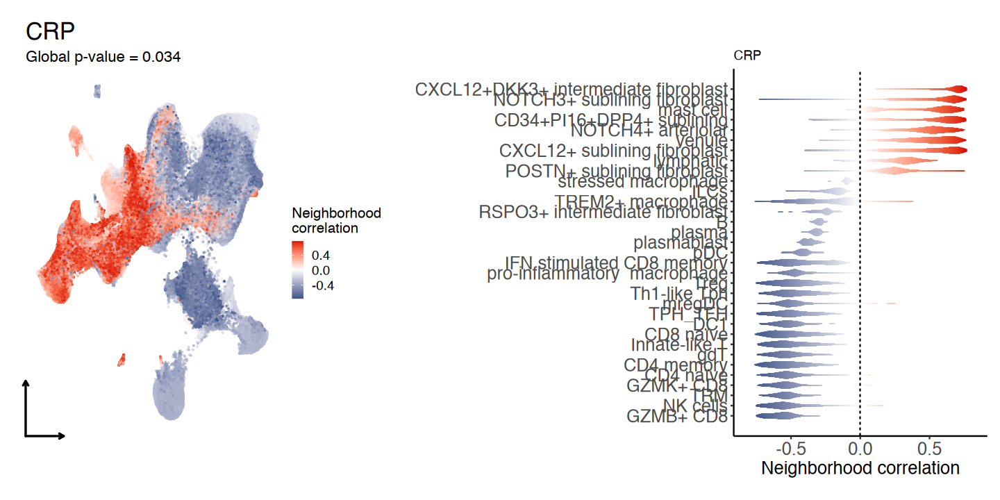

[1] "treatment_MTX"


Build NAM PCs

stopping after 4 steps

only one unique batch supplied to qc

only one unique batch supplied to prep

Perform association testing

computing neighborhood-level FDRs



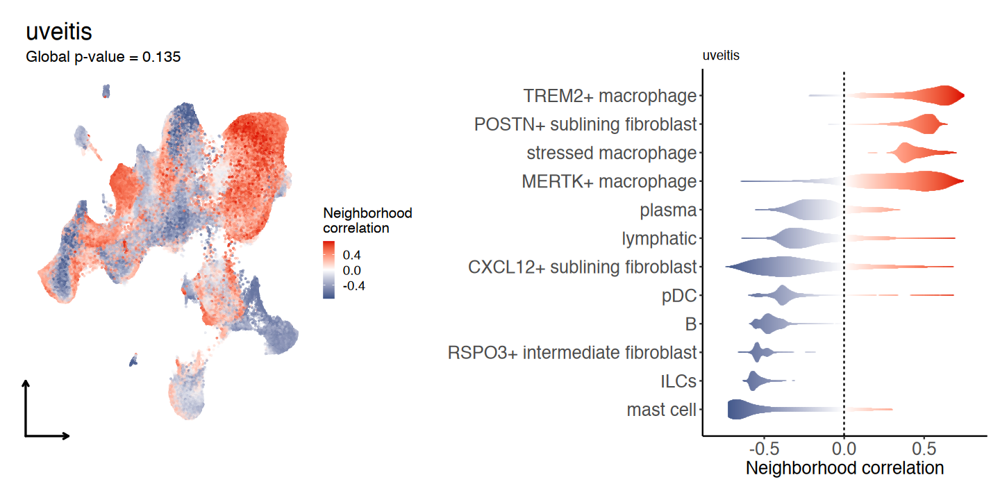

[1] "treatment_MTX_bio"


Build NAM PCs

stopping after 4 steps

only one unique batch supplied to qc

only one unique batch supplied to prep

Perform association testing

computing neighborhood-level FDRs



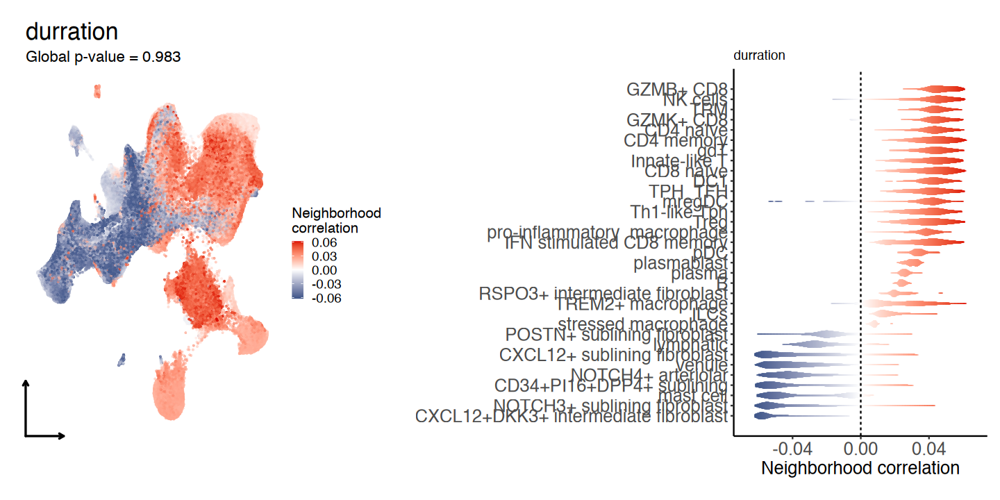

[1] "treatment_Na<U+00EF>ve"


Build NAM PCs

stopping after 4 steps

only one unique batch supplied to qc

only one unique batch supplied to prep

Perform association testing

computing neighborhood-level FDRs



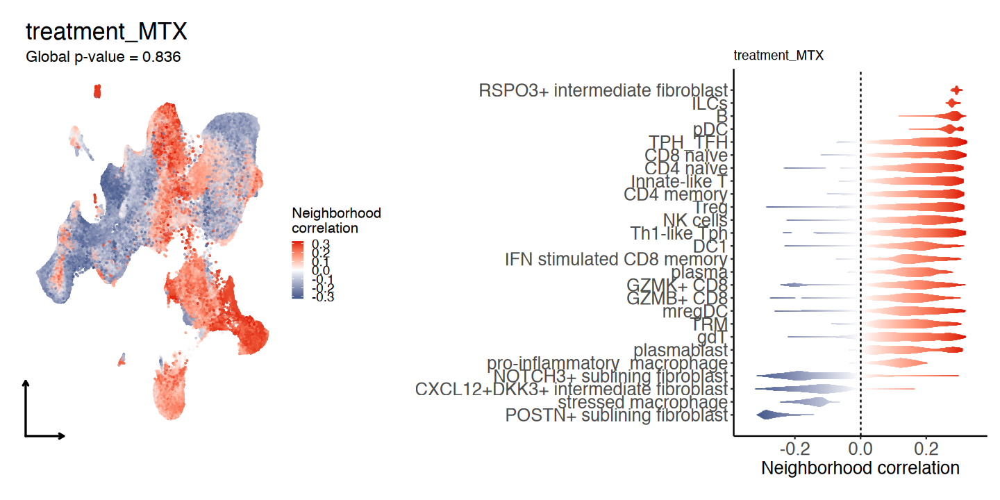

[1] "treatment_steroid_injection"


Build NAM PCs

stopping after 4 steps

only one unique batch supplied to qc

only one unique batch supplied to prep

Perform association testing

computing neighborhood-level FDRs



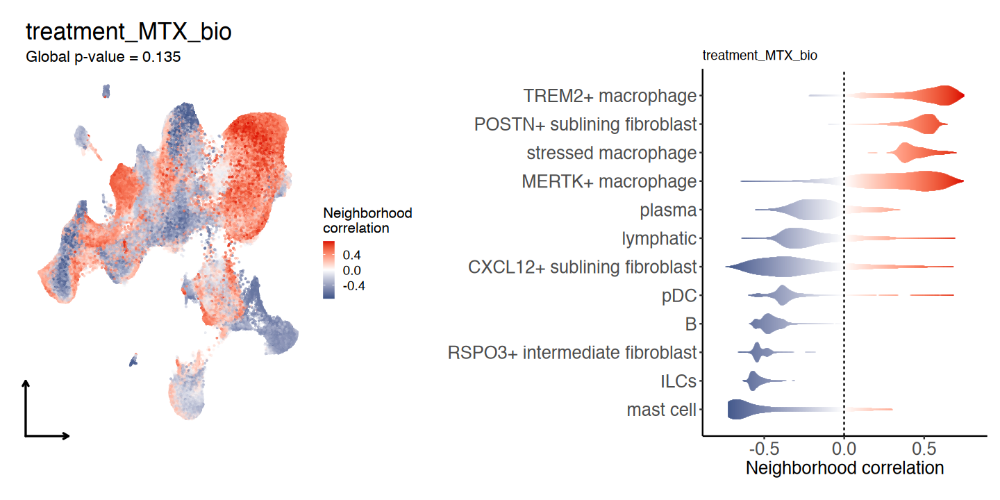

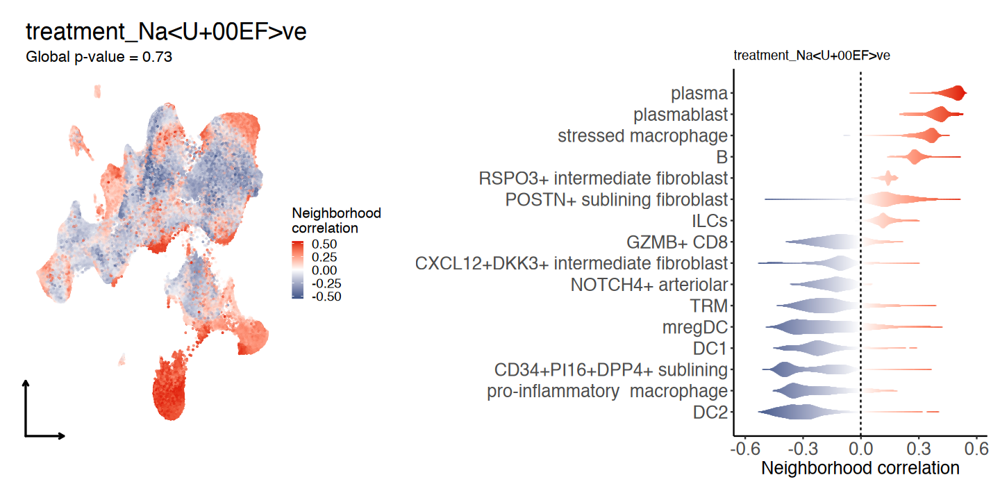

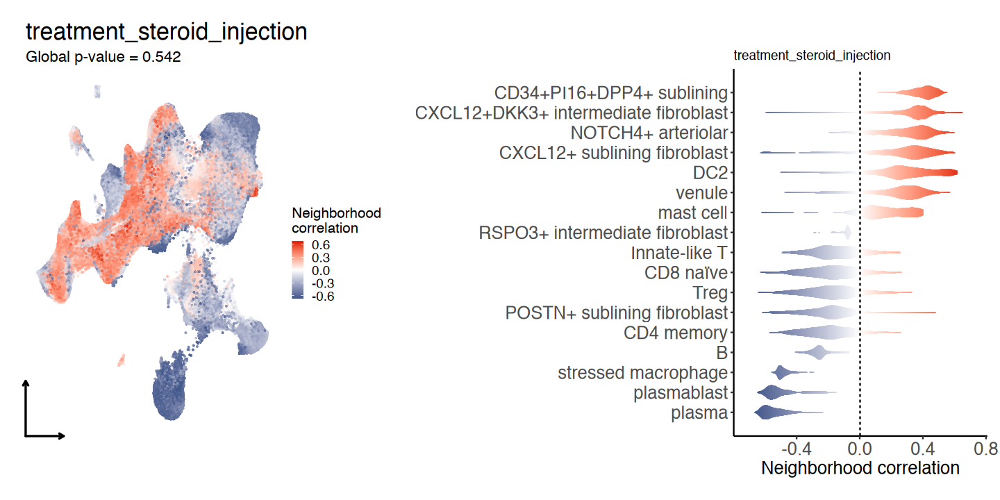

In [14]:
library(rcna)
library(glue)
library(lme4)

remove_clusters = c("mixed","muscle","proliferating cells")
if(!any(is.na(remove_clusters))){
  remove_clusters = intersect(remove_clusters, Idents(ste))
  ste = subset(ste, idents = remove_clusters, invert=TRUE)
}

cluster_stats <- Cluster_Stats_All_Samples(seurat_object = ste, group_by_var = "sample_id")
clu_df = cluster_stats[,grep("%$",colnames(cluster_stats),invert = TRUE)] %>%
  dplyr::select(-Number, -Freq) %>%  
  tidyr::pivot_longer(cols = -Cluster, names_to = "Sample", values_to = "Value") %>%
  dplyr::filter(Cluster %in% levels(Idents(ste))) %>%
  dplyr::group_by(Sample) %>%
  dplyr::mutate(Percentage = Value / sum(Value) * 100) %>%
  dplyr::ungroup() %>%
  na.omit() %>%
  dplyr::mutate(Cluster = factor(Cluster, levels = levels(Idents(ste)))) 

thresh_pro=0.8
# one-hot encoding
one_hot <- model.matrix(~ treatment - 1, data = ste@meta.data)
colnames(one_hot) <- gsub("treatment", "treatment_", colnames(one_hot))
ste = AddMetaData(ste, one_hot)

df = data.frame()

options(repr.plot.width = 12, repr.plot.height = 6)

for(var_ in c("CRP","uveitis","durration",colnames(one_hot))){
  
  print(var_)
  
  if(var_ == "uveitis"){
    ste@meta.data$condition_val = as.numeric(factor(ste@meta.data[,var_],levels=c("no","yes")))-1
  } else {
    ste@meta.data$condition_val = as.numeric(ste@meta.data[,var_])
  }
  ste@meta.data$sex_val = as.numeric(factor(ste@meta.data$sex))-1
  table(ste@meta.data$sex_val)
  table(ste@meta.data$age)
  ste@meta.data$slide_id = as.numeric(factor(ste@meta.data$slide))
  colnames(ste@meta.data)
  covs = c("age","sex_val")
  set.seed(1234)
  tryCatch({
    ste <- association.Seurat(
      seurat_object = ste, 
      test_var = 'condition_val', 
      samplem_key = 'sample_id', 
      graph_use = 'SCT_snn', 
      verbose = TRUE,
      #batches = "slide_id",
      batches = NULL,
      covs = covs
    )
  }, error = function(e) {
    print(e)
  })
  
  
  g1 = cbind(ste[["umap"]]@cell.embeddings,ste@meta.data) %>%
    dplyr::select(c(umap_1,umap_2,cna_ncorrs)) %>%
    dplyr::mutate(trans = abs(cna_ncorrs)*2) %>%
    ggplot(aes(x = umap_1, y = umap_2)) +
    geom_point_rast(
      aes(color = cna_ncorrs, alpha = trans),
      size = 1, stroke = 0, shape = 16
    ) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab" ) +
    labs(
      x = "UMAP1",
      y = "UMAP2",
      title = var_, 
      subtitle = paste0("Global p-value = ", signif(ste@reductions$cna@misc$p, 3)),
      color = 'Neighborhood\ncorrelation'
    ) +
    theme_blank(base_size = 20) +
    theme(
      legend.position = "right",
      axis.text = element_blank(),
      axis.ticks = element_blank(),
      panel.grid = element_blank(),
      plot.title = element_text(color="black", size=20)
    ) + 
    guides(alpha = "none")
  
  sig_clu = ste@meta.data %>%
    dplyr::group_by(new_cluster) %>%
    dplyr::summarise(pos_pro = sum(cna_ncorrs>0)/n(),
                     neg_pro = sum(cna_ncorrs<0)/n()) %>%
    dplyr::filter(pos_pro >= thresh_pro | neg_pro >= thresh_pro) %>%
    .$new_cluster
  
  ord = cbind(ste[["umap"]]@cell.embeddings,ste@meta.data) %>%
    dplyr::select(c(umap_1,umap_2,cna_ncorrs,new_cluster)) %>%
    dplyr::filter(new_cluster %in% sig_clu) %>%
    dplyr::group_by(new_cluster) %>%
    dplyr::summarize(med = median(cna_ncorrs)) %>%
    dplyr::arrange(med) %>%
    .$new_cluster
  p <- cbind(ste[["umap"]]@cell.embeddings,ste@meta.data) %>%
    dplyr::select(c(umap_1,umap_2,cna_ncorrs,new_cluster)) %>%
    dplyr::mutate(new_cluster = factor(new_cluster,levels=ord)) %>%
    na.omit() %>%
    ggplot(aes(x=new_cluster, y=cna_ncorrs)) + 
    geom_violin(trim=TRUE, scale = "width")
  mywidth <- .35 
  vl_fill <- data.frame(ggplot_build(p)$data) %>%
    mutate(xnew = x- mywidth*violinwidth, xend = x+ mywidth*violinwidth) 
  vl_poly <- 
    vl_fill %>% 
    dplyr::select(xnew, xend, y, group) %>%
    tidyr::pivot_longer(-c(y, group), names_to = "oldx", values_to = "x") %>% 
    dplyr::arrange(y) %>%
    split(., .$oldx) %>%
    purrr::map(., function(x) {
      if(all(x$oldx == "xnew")) x <- dplyr::arrange(x, dplyr::desc(y))
      x
    }) %>%
    dplyr::bind_rows()
  g2 = ggplot() +
    geom_polygon(data = vl_poly, aes(x, y, group = group), size = 1, fill = NA) +  
    geom_segment(data = vl_fill, aes(x = xnew, xend = xend, y = y, yend = y, color = y)) +
    scale_color_gradient2(midpoint = 0, low = '#3C5488FF', mid = "white", high = '#DC0000FF', space = "Lab") +
    scale_x_continuous(labels=ord, 
                       breaks=1:length(unique(ord)) , 
                       limits=c(min(vl_poly$x),max(vl_poly$x))) +
    scale_y_continuous(expand = expansion(mult = c(0.1, 0.1))) +
    # geom_hline(yintercept=c(min(cor_pos), max(cor_neg)), linetype='dashed', color='black') +
    geom_hline(yintercept=0, linetype='dashed', color='black') +
    theme_classic() +
    coord_flip() +   
    theme(strip.text.x=element_text(size=15, color="black", face="bold"),
          strip.text.y=element_text(size=15, color="black", face="bold"),
          legend.position = "none",
          plot.title = element_text(size=15),
          axis.title.x = element_text(size=15),
          axis.title.y = element_text(size =15),
          axis.text.y = element_text(size =15),
          axis.text.x = element_text(size =15),
          legend.text =  element_text(size = 15),
          legend.key.size = grid::unit(0.5, "lines"),
          legend.title = element_text(size = 0.8, hjust = 0)) +
    labs(title = "",
         subtitle = var_,
         x = "",
         y = "Neighborhood correlation")  
  plot(g1 | g2)
  
  df = data.frame(var = var_,
                  global_p = ste@reductions$cna@misc$p,
                  res_cell = ste@meta.data[,cluster_col],
                  ncorrs = ste@meta.data$cna_ncorrs) %>%
    dplyr::mutate(direction = case_when(
      ncorrs > 0 ~ "Expanded",
      ncorrs < 0 ~ "Depleted",
      TRUE ~ NA_character_
    )) %>%
    dplyr::filter(!is.na(direction)) %>%
    dplyr::group_by(var, global_p, res_cell, direction) %>%
    dplyr::summarise(n = n(), .groups = "drop") %>%
    dplyr::group_by(res_cell) %>%
    dplyr::mutate(pct = 100 * n / sum(n)) %>%
    dplyr::ungroup() %>%
    dplyr::filter(direction == "Expanded") %>%
    dplyr::select(var, global_p, res_cell, pct) %>%
    tidyr::pivot_wider(names_from = res_cell, values_from = pct, values_fill = 0) %>%
    dplyr::bind_rows(.,
                     df)
 
}


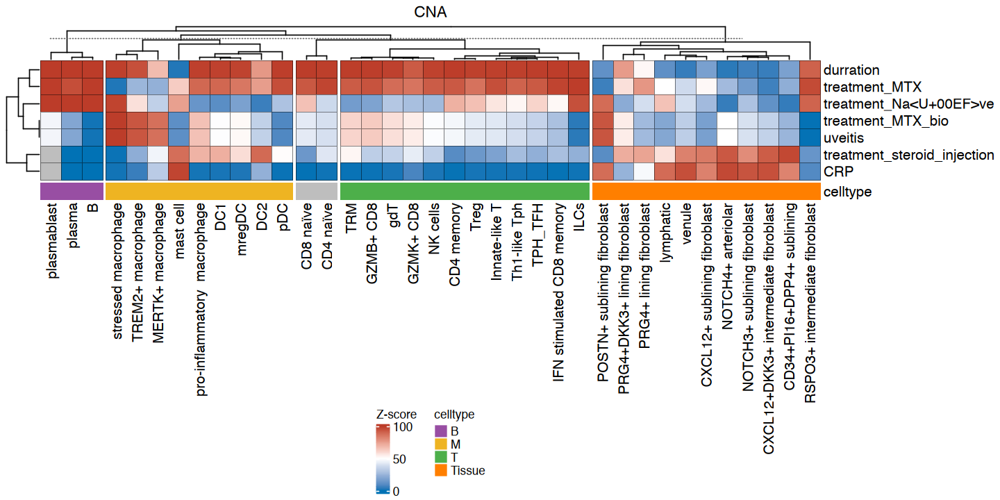

In [15]:

mat = df[,-2] %>%
  tibble::column_to_rownames("var") 

column_ha = HeatmapAnnotation(celltype = ifelse(colnames(mat) %in% unique(Idents(ste)[ste@meta.data$celltype=="T"]), "T",
                                                ifelse(colnames(mat) %in% unique(Idents(ste)[ste@meta.data$celltype=="B"]), "B",
                                                       ifelse(colnames(mat) %in% unique(Idents(ste)[ste@meta.data$celltype=="M"]), "M",
                                                              ifelse(colnames(mat) %in% unique(Idents(ste)[ste@meta.data$celltype=="Tissue"]), "Tissue", "")))),
                              col = list(celltype = c("T" = "#4DAF4A",
                                                      "B" = "#984EA3",
                                                      "M" = "goldenrod2",
                                                      "Tissue" = "#FF7F00")))

heatmap <- Heatmap(mat,
                   name = "Z-score",
                   col = colorRamp2(c(0, 50, 100), c("#0072B5FF", "white", "#BC3C29FF")), 
                   show_row_names = TRUE, 
                   show_column_names = TRUE,  
                   cluster_rows = TRUE,  
                   cluster_columns = TRUE,  
                   #show_column_dend = FALSE,
                   #show_row_dend = FALSE,
                   row_title = "",  
                   column_title = "CNA",
                   bottom_annotation = column_ha,
                   rect_gp = gpar(col = "black", lwd = 0.3),
                   column_split = ifelse(colnames(mat) %in% unique(Idents(ste)[ste@meta.data$celltype=="T"]), "T",
                                         ifelse(colnames(mat) %in% unique(Idents(ste)[ste@meta.data$celltype=="B"]), "B",
                                                ifelse(colnames(mat) %in% unique(Idents(ste)[ste@meta.data$celltype=="M"]), "M",
                                                       ifelse(colnames(mat) %in% unique(Idents(ste)[ste@meta.data$celltype=="Tissue"]), "Tissue", ""))))
)

options(repr.plot.width = 12, repr.plot.height = 6)
draw(heatmap, 
     merge_legend = TRUE,
     heatmap_legend_side = "bottom", 
     annotation_legend_side = "bottom")



### gsMap

https://github.com/JianYang-Lab/gsMap

```bash

#conda create -n gsMap python=3.10
conda activate gsMap
#pip install gsmap
#gsmap -v

DIR="/path/to/projects/JIA_Xenium"
cd $DIR

cd gsMap/

gsMap format_sumstats \
  --sumstats GCST90010715_with_N.tsv \
  --out GCST90010715_gsMap_formatted.tsv \
  --snp variant_id \
  --a1 alleleA \
  --a2 alleleB \
  --frq all_maf \
  --OR all_OR \
  --se_OR frequentist_add_se_1 \
  --p p_value \
  --beta frequentist_add_beta_1 \
  --chr chromosome \
  --pos position \
  --n N \
  --format gsMap \
  --info_min 0 \
  --maf_min 0

                    
#Filtering SNPs as follows:
#[2025-04-20 10:06:58,005] INFO | gsMap.format_sumstats - Removed 0 SNPs with missing values.
#[2025-04-20 10:06:58,349] INFO | gsMap.format_sumstats - Removed 0 SNPs with MAF <= 0.01.
#[2025-04-20 10:06:58,655] INFO | gsMap.format_sumstats - Removed 0 SNPs with out-of-bounds p-values.
#[2025-04-20 10:07:00,272] INFO | gsMap.format_sumstats - Removed 1127040 variants that were not SNPs or were strand-ambiguous.
#[2025-04-20 10:07:02,256] INFO | gsMap.format_sumstats - Removed 0 SNPs with duplicated rs numbers.
#[2025-04-20 10:07:02,657] INFO | gsMap.format_sumstats - Removed 0 SNPs with N < 12424.666666666666.
#[2025-04-20 10:07:02,701] INFO | gsMap.format_sumstats - 
#Summary of GWAS data:
#[2025-04-20 10:07:02,708] INFO | gsMap.format_sumstats - Mean chi^2 = 1.173
#[2025-04-20 10:07:02,782] INFO | gsMap.format_sumstats - Lambda GC = 1.06
#[2025-04-20 10:07:02,787] INFO | gsMap.format_sumstats - Max chi^2 = 684.264
#[2025-04-20 10:07:02,789] INFO | gsMap.format_sumstats - 7008 Genome-wide significant SNPs (some may have been removed by filtering).
#[2025-04-20 10:07:02,918] INFO | gsMap.format_sumstats - 
#Writing summary statistics for 6334221 SNPs to GCST90010715_gsMap_formatted.tsv.sumstats.gz.
#[2025-04-20 10:07:29,817] INFO | gsMap - Finished running format_sumstats at: 2025-04-20 10:07:29.
#[2025-04-20 10:07:30,003] INFO | gsMap - Resource usage summary:
#[2025-04-20 10:07:30,003] INFO | gsMap -   • Wall clock time: 51.20 seconds
#[2025-04-20 10:07:30,003] INFO | gsMap -   • CPU time: 54.37 seconds
#[2025-04-20 10:07:30,003] INFO | gsMap -   • Average CPU utilization: 106.8%
#[2025-04-20 10:07:30,003] INFO | gsMap -   • Peak memory usage: 7.58 GB

cd $DIR

H5AD_DIR="${DIR}/gsMap"
WORKDIR_ROOT="${DIR}/gsMap/out"
RESOURCE_DIR="${DIR}/gsMap/gsMap_resource"
SUMSTATS_FILE="${DIR}/gsMap/GCST90010715_gsMap_formatted.tsv.sumstats.gz"
TRAIT="JIA"

# quick mode
for h5ad_file in ${H5AD_DIR}/*.h5ad; do
  filename=$(basename "$h5ad_file")
  sample_name="${filename%.h5ad}"

  echo "🔄 Running gsMap for sample: $sample_name"

  gsmap quick_mode \
    --workdir "${WORKDIR_ROOT}/" \
    --sample_name "${sample_name}" \
    --gsMap_resource_dir "${RESOURCE_DIR}" \
    --hdf5_path "${h5ad_file}" \
    --annotation "annotation" \
    --data_layer "count" \
    --sumstats_file "${SUMSTATS_FILE}" \
    --trait_name "${TRAIT}"
    
  echo "✅ Finished: $sample_name"
done

gsmap run_cauchy_combination \
    --workdir "${WORKDIR_ROOT}/" \
    --sample_name_list "SB4" "SB10" "SB14" "SB19" "SB21" "SB25" "SB29" "SB30" "SB62" \
    --trait_name "${TRAIT}" \
    --annotation "annotation" \
    --output_file "${WORKDIR_ROOT}/cauchy_combination_${trait_name}.csv.gz" \
    > "${WORKDIR_ROOT}/cauchy_combination_${trait_name}.log" 2>&1


```

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


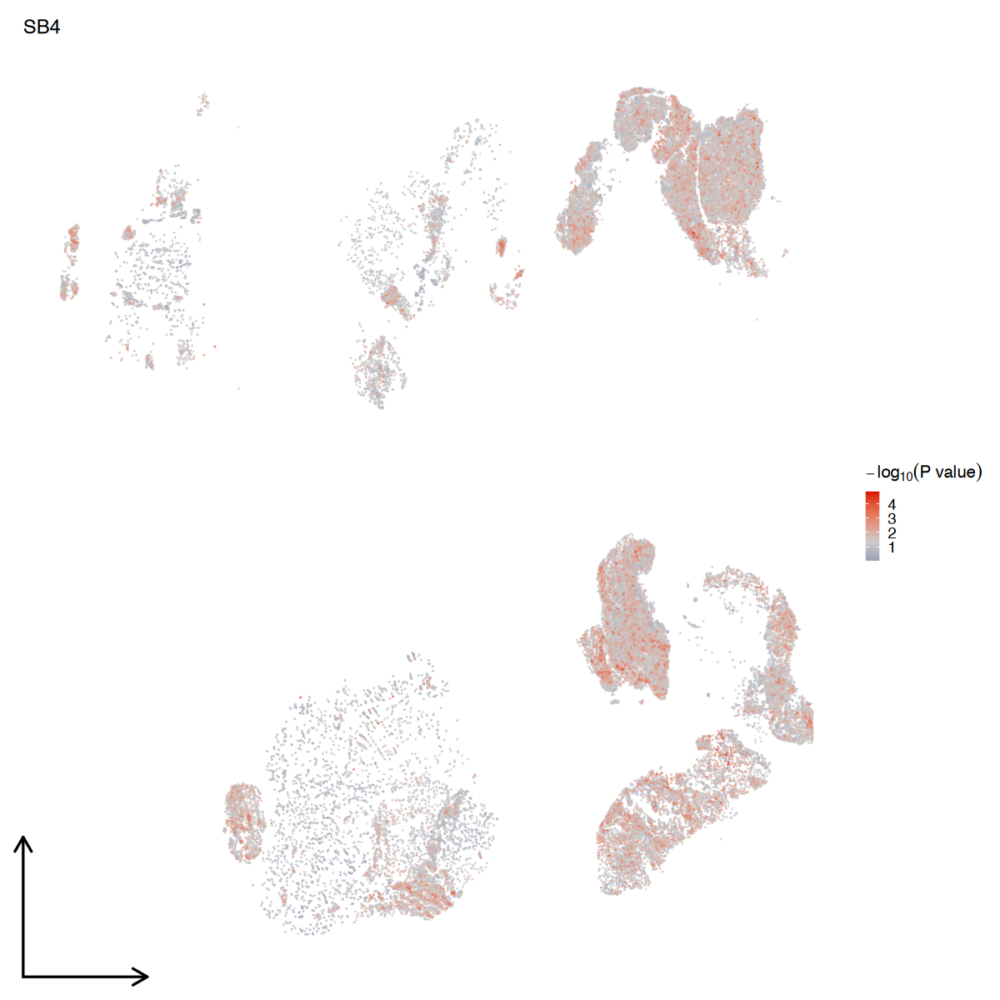

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


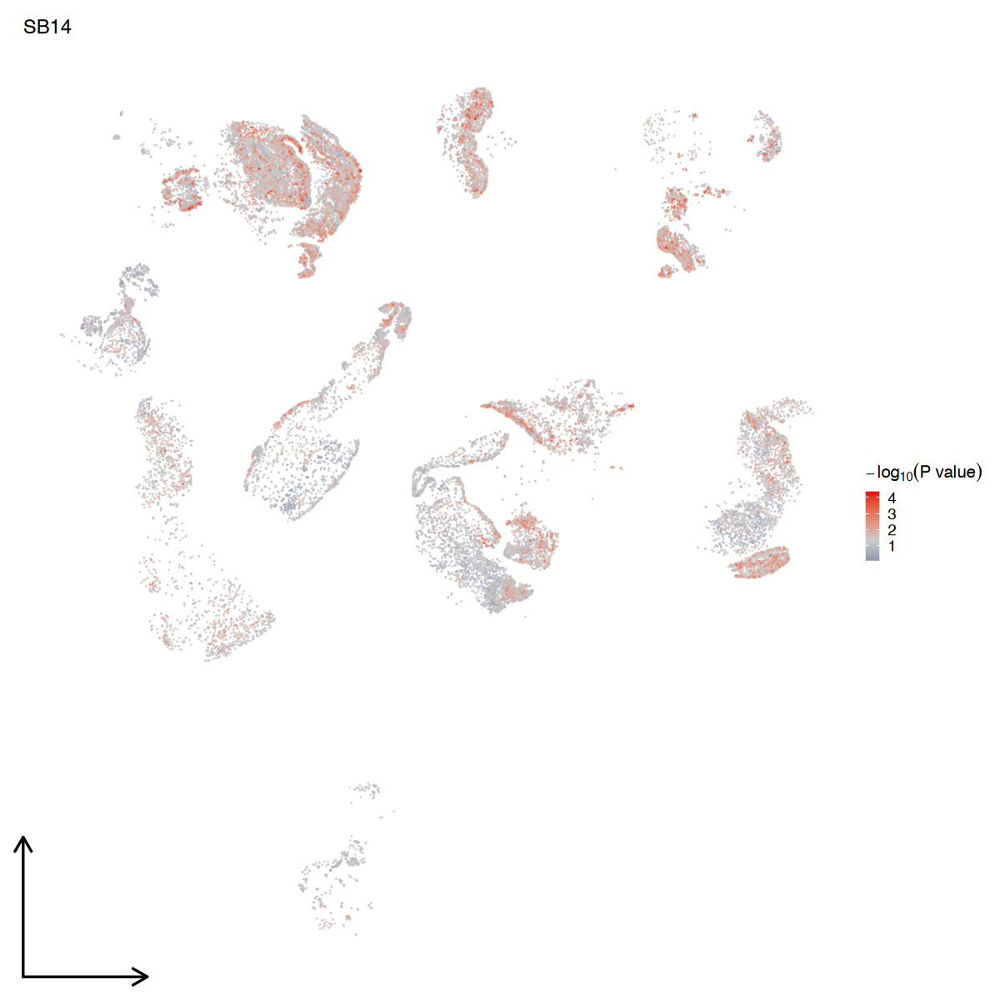

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


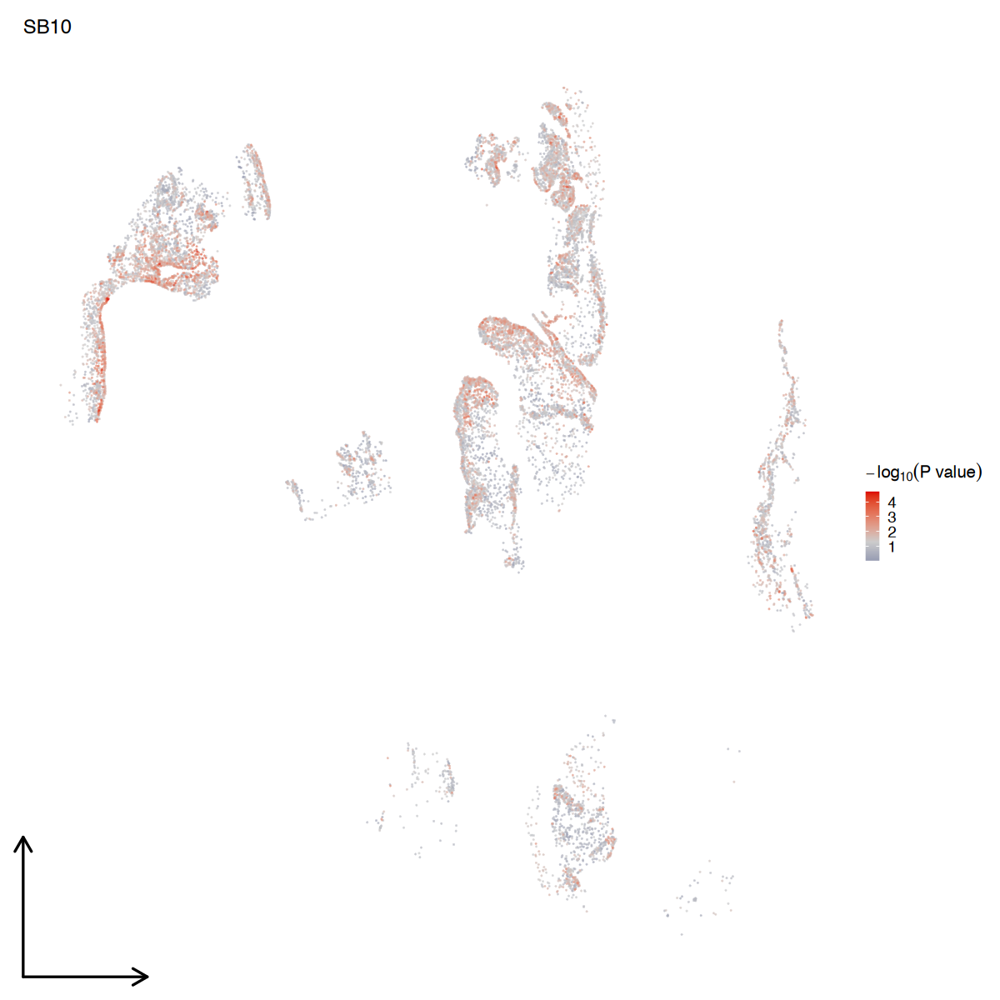

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


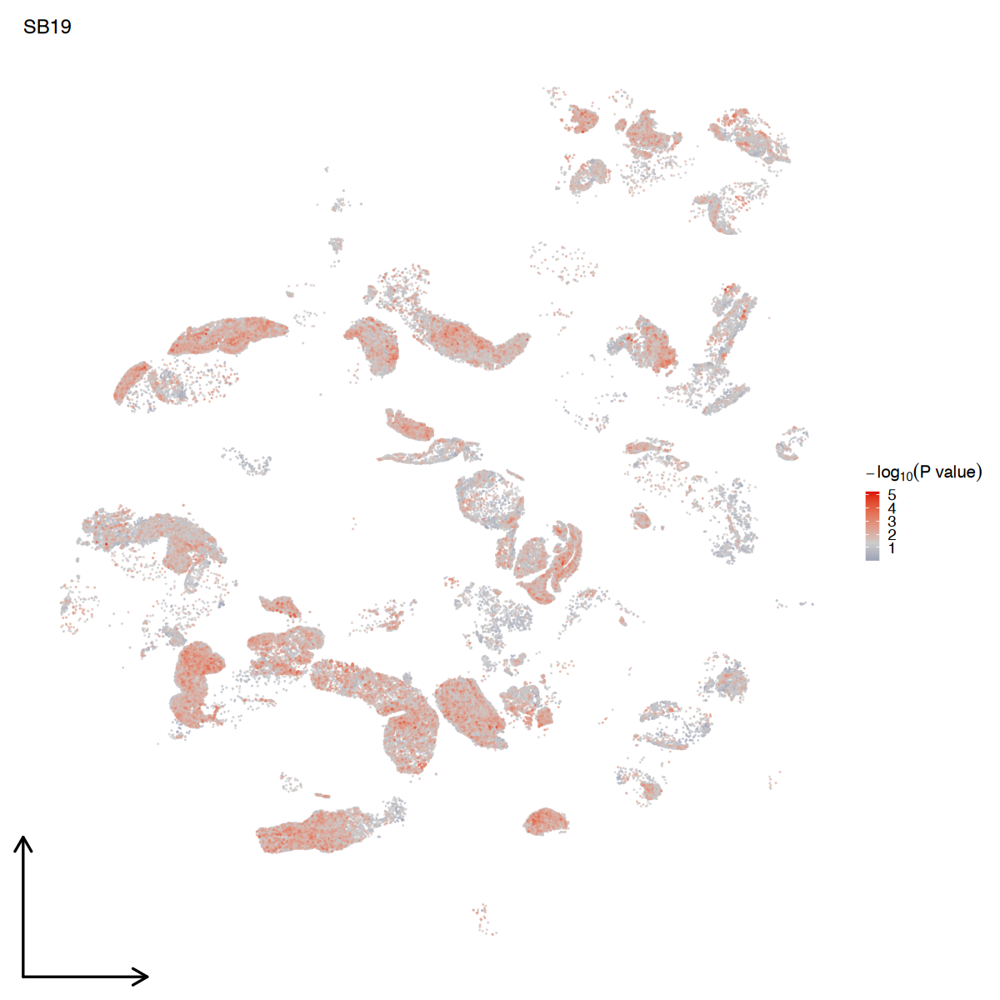

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


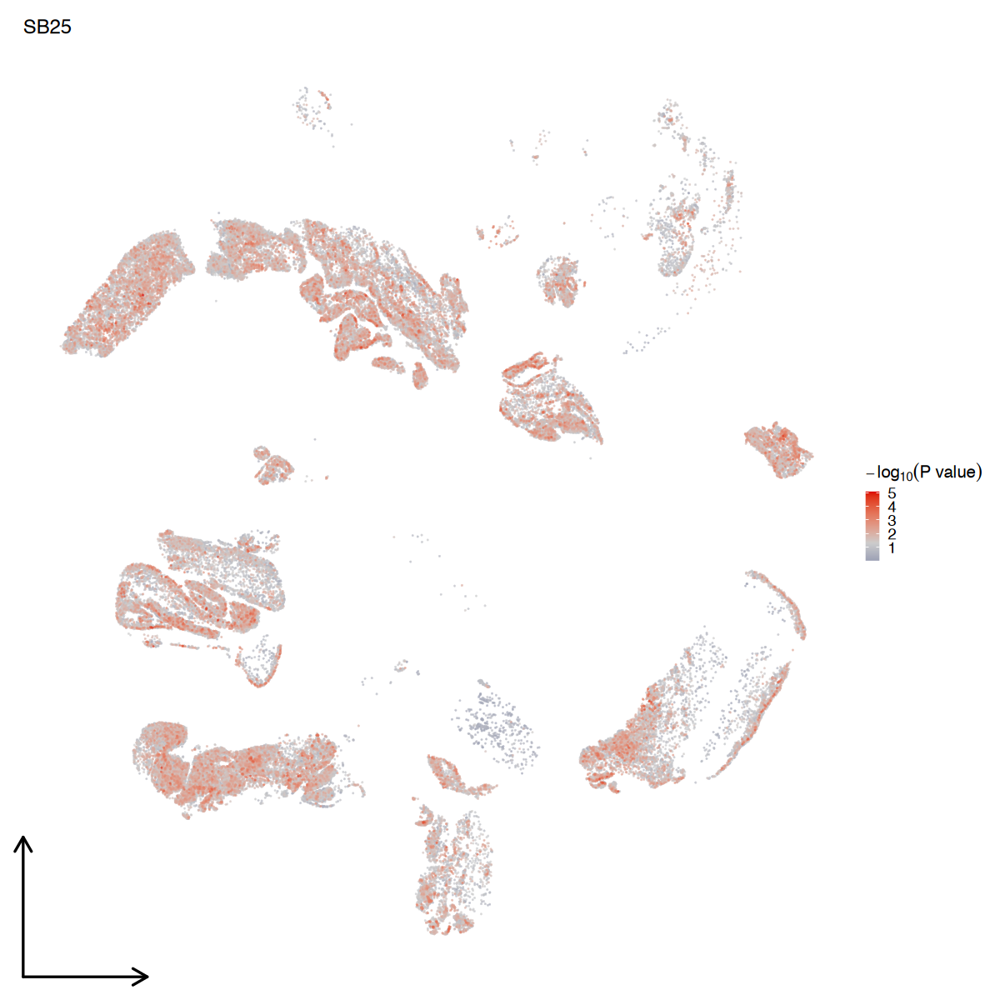

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


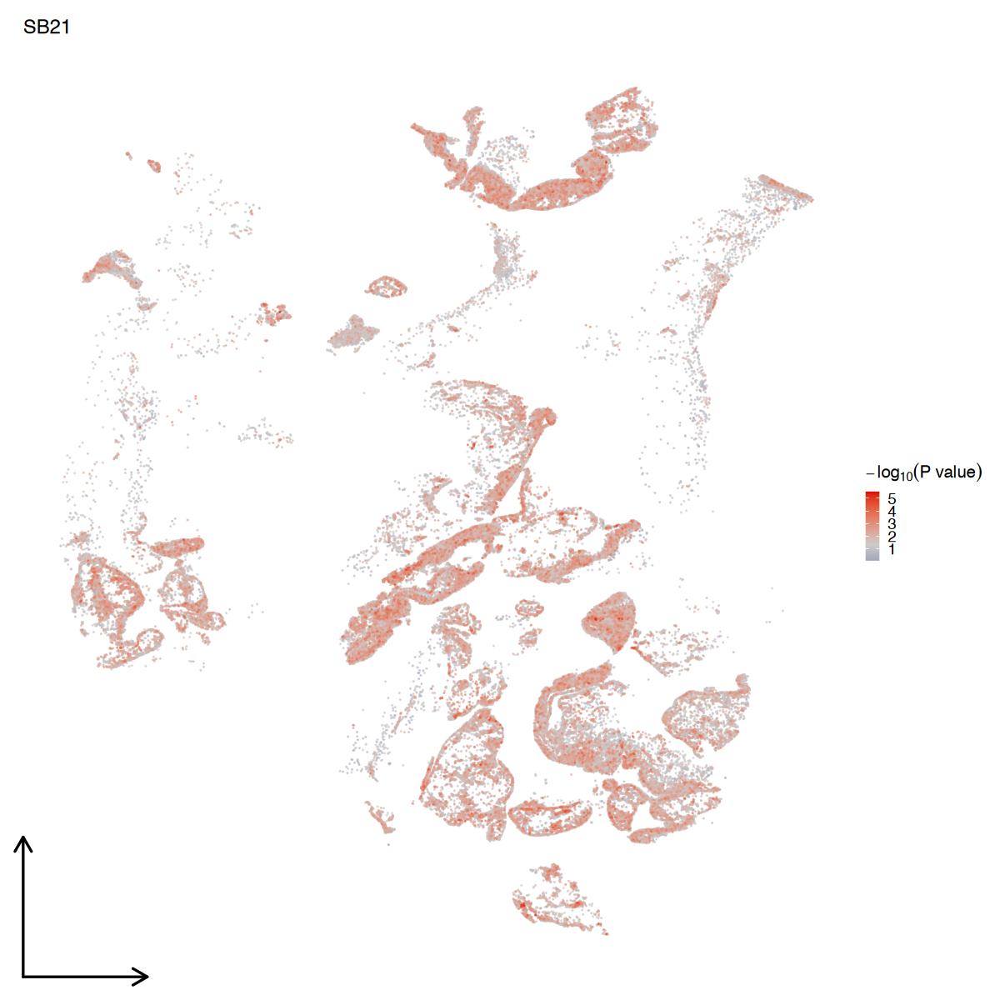

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


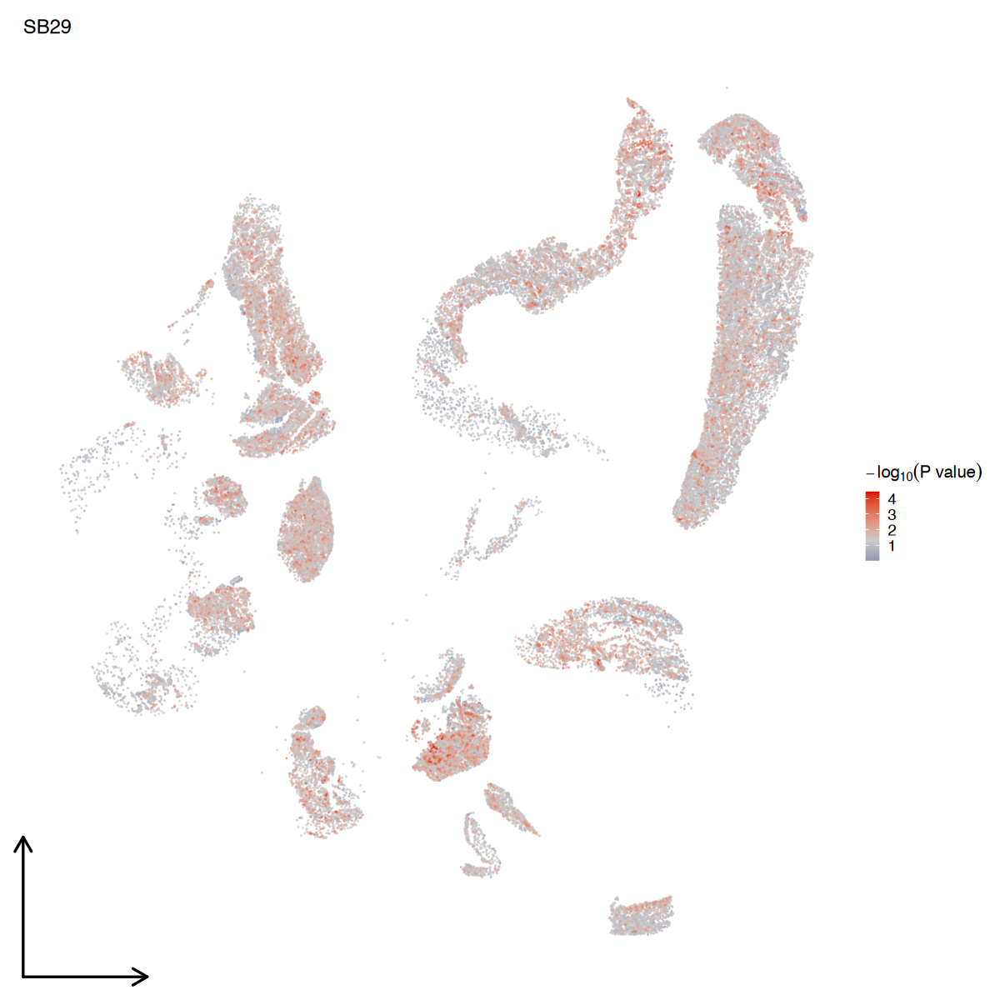

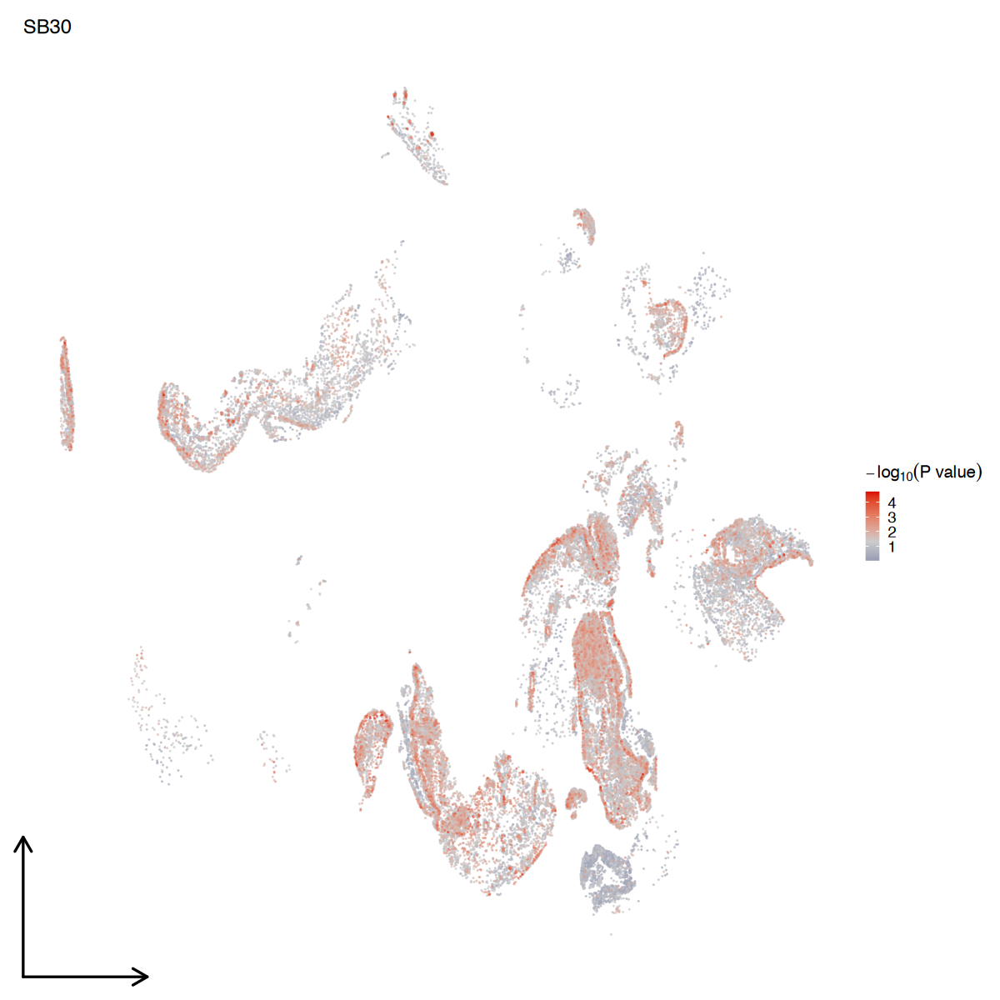

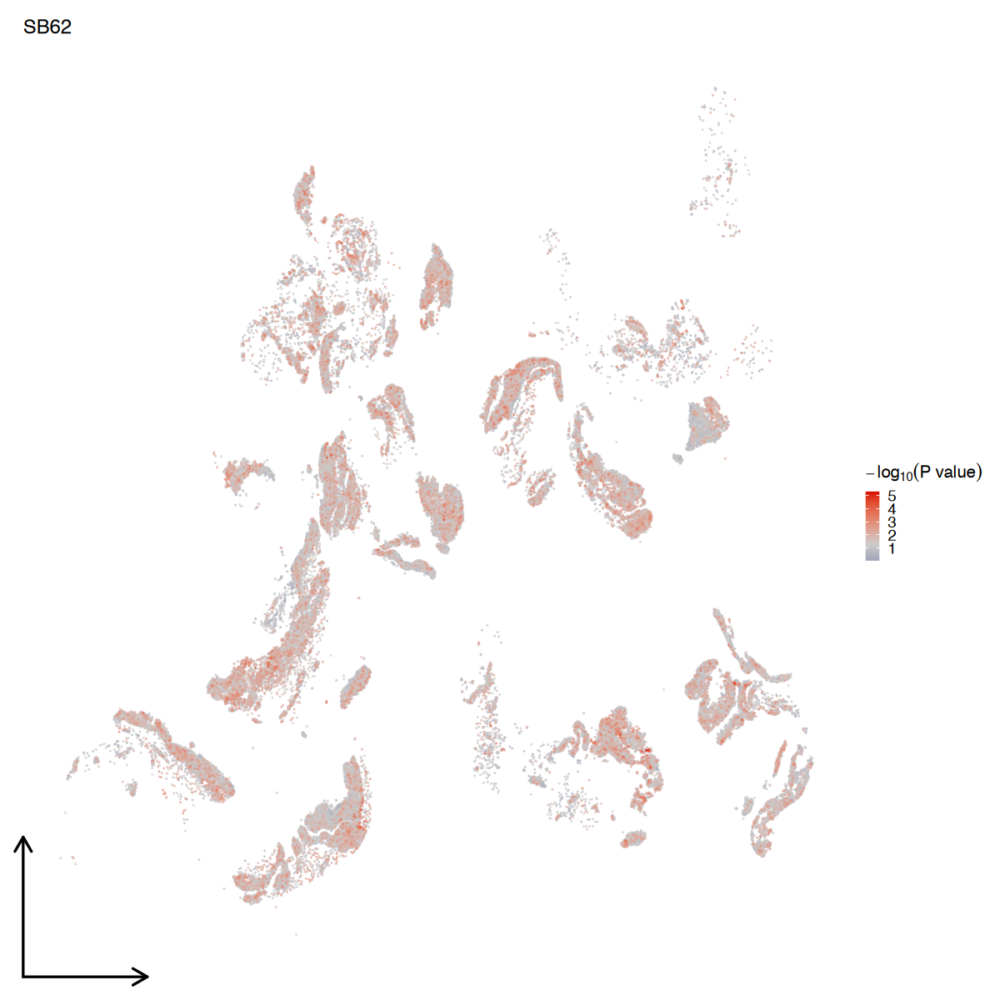

In [16]:

options(repr.plot.width = 10, repr.plot.height = 10)
plot_data = data.frame()
for(name in c("SB4","SB14","SB10","SB19","SB25","SB21","SB29","SB30","SB62")) {
  plot_data_ = read.csv(paste0("./../gsMap/out/",name,"/report/JIA/gsMap_plot/",name,"_JIA_gsMap_plot.csv"))
  g = ggplot(plot_data_ %>% dplyr::arrange(logp), aes(x = sx, y = sy, color = logp) ) +
    geom_point_rast(size = 0.01, alpha = 0.5) +
    scale_color_gradient2(midpoint = 1.3, low = '#3C5488FF', mid = "grey80", high = '#DC0000FF',name = expression(-log[10](P~value)), space = "Lab" ) +
    coord_fixed() +
    theme_blank() +
    theme(legend.position = "right") +
    ggtitle(paste0(name))
  plot(g)
  
  plot_data = rbind(plot_data,
                    plot_data_)
}


Registered S3 methods overwritten by 'proxy':
  method               from    
  print.registry_field registry
  print.registry_entry registry

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


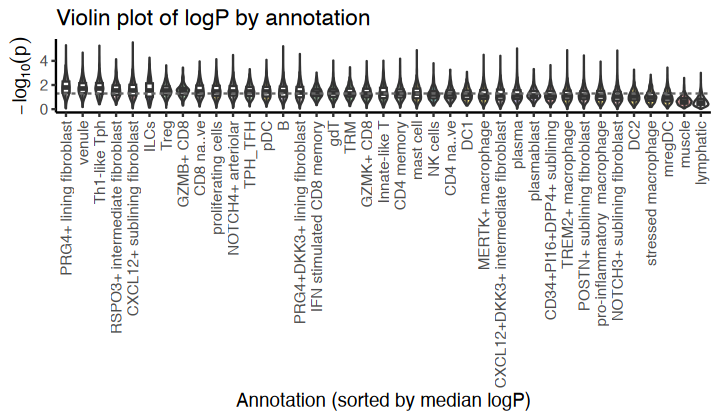

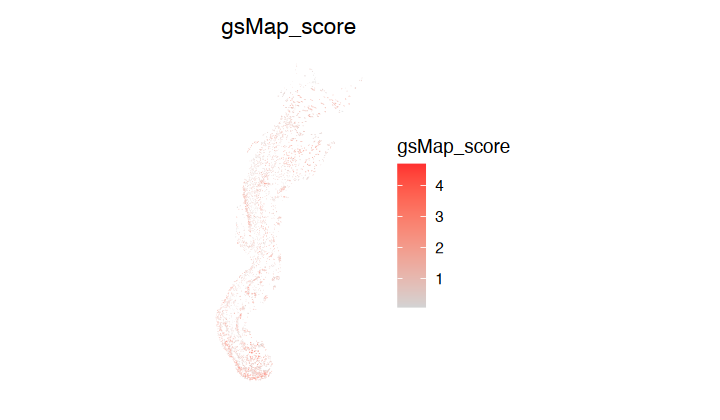

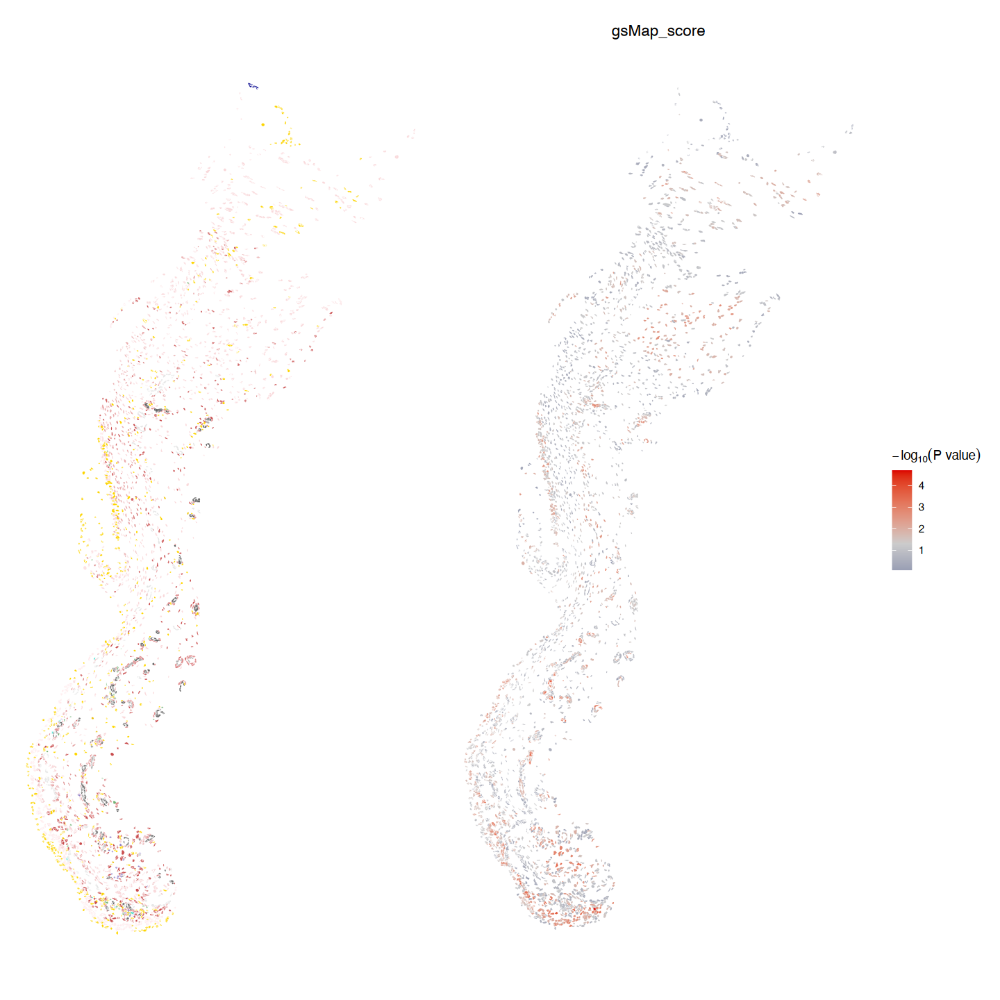

In [17]:
options(repr.plot.width = 6, repr.plot.height = 3.5)

g = plot_data %>%
  dplyr::filter(annotation != "mixed") %>%
  dplyr::filter(annotation !=" muscle") %>%
  dplyr::mutate(annotation = forcats::fct_reorder(annotation, logp, .fun = median, .desc = TRUE)) %>%
  ggplot(., aes(x = annotation, y = logp)) +
  #geom_jitter_rast(width = 0.1, size = 0.01, alpha = 0.1) +
  geom_violin(aes(fill = annotation), alpha = 0.5) +
  geom_boxplot(width = 0.4, outlier.size = 0, outlier.shape = NA) +
  geom_hline(yintercept = -log10(0.05), linetype = "dashed", color = "grey40") +
  scale_fill_manual(values = cluster_COLORS__) +
  theme_classic() +
  labs(
    x = "Annotation (sorted by median logP)",
    y = expression(-log[10](italic(p))),
    title = "Violin plot of logP by annotation"
  ) +
  theme(
    axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5),
    legend.position = "none"
  )
plot(g)

ste@meta.data$gsMap_score = data.frame(cell = rownames(ste@meta.data),
                                       ste[["umap"]]@cell.embeddings) %>%
  dplyr::left_join(., plot_data, by=c("cell"="X")) %>%
  dplyr::pull(logp)
  
# zoom in on SB30
ste = subset(ste, sample_id == "SB30")
x_lower = 1000
x_upper = 6000
y_lower = 3500
y_upper = 6000
cropped.coords <- Crop(ste[["SB30"]], x = c(x_lower, x_upper), y = c(y_lower, y_upper), coords = "tissue")
ste[["zoom"]] <- cropped.coords
# visualize cropped area with cell segmentations & selected molecules
DefaultBoundary(ste[["zoom"]]) <- "segmentation"

ste_ = subset(ste, cells = Cells(ste[["zoom"]]))
Idents(ste_) = ste_@meta.data[,cluster_col]

coords =  ste[["zoom"]]$centroids@coords %>%
  as.data.frame()

g1 = ImageDimPlot(subset(ste, new_cluster != "mixed" & new_cluster != "muscle"), 
                   fov = "zoom", 
                   #axes = TRUE, 
                   cols = cluster_COLORS__, 
                   #cols = "glasbey",
                   #cols = cluster_COLORS, 
                   size = 1.5, 
                   border.color = "grey95",
                   border.size = 0.001,
                   dark.background = F) &
  theme_void(base_size = 30) &
  theme(legend.text = element_text(size = 10),
        legend.title = element_blank(),
        legend.position = "none")

g2 = base::plot(ImageFeaturePlot(subset(ste, new_cluster != "mixed" & new_cluster != "muscle"), 
                                 #size = 2,
                            features = "gsMap_score", 
                            fov = "zoom", 
                            border.size = 0,
                            border.color = NA,
                            dark.background = F)) &
  scale_fill_gradient2(midpoint = 1.3, low = '#3C5488FF', mid = "grey80", high = '#DC0000FF',name = expression(-log[10](P~value)), space = "Lab" ) 

options(repr.plot.width = 12, repr.plot.height = 12)
plot(g1 | g2)

